# A study of the stochastic Saltzman-Maasch model for climate dynamics in Pleistocene

## Deterministic system
This work is concerned with the internal dynamics of a conceptual model derived from a model proposed by Maasch and Saltzman (in 1990 and 1991), in order to explain central features of the glacial cycles observed in the climate record of the Pleistocene Epoch. The model descibes the departures of the global ice mass, the atmospheric carbon dioxide concentration, and the mean deep-ocean temperature from their equilibrium values. The model, object of this work, can be described by the following system of differential equations:
$$
\begin{cases}
    \dot{X} = -X -Y -vZ \\ 
    \dot{Y} = -pZ + rY -sY^2 -Y^3 \\
    \dot{Z} = -q(X+Z) \ \ .
\end{cases}
$$
The parameters $r$ and $s$ determine the growth and damping rates of the atmospheric carbon dioxide, $q$ gives the damping rate of the mean ocean temperature and describes the feedback effect induced by the global ice mass, whereas $v$ and $p$ characterize the feedbacks of $Z$ on $\dot{X}$ and $\dot{Y}$. The parameters $p, q, r, s$ are all combinations of various physical parameters, and they are all positive. Moreover, for physical reasons, $q > 1$. The parameter $s$ is a symmetry parameter. In fact, with $s = 0$, the model possesses a reflection symmetry, i.e. if $(x, y, z)$ is a solution of the dynamical system, then so is $(−x, −y, −z)$. In this special case, glaciation and deglaciation occur at the same rates. Experimentally, however, it is observed that deglaciation occurs at a faster rate than glaciation, and $s > 0$ guarantees this asymmetry, in a more realistic framework.

In the following code boxes is written the python class used to simulate this dynamical system. In order to simulate the pure deterministic system, the parameter $\epsilon$ (which models the white noise term, and that it will be used further) has to be set to 0. 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import math
import time
import random
from numpy.random import Generator, PCG64

rng_0 = Generator(PCG64())

In [2]:
class Saltzmann_Maasch(object):
    '''
    The nondimensional parameters p, q, r, and s are each combinations of various physical parameters, 
    and they are all positive. Here, p and r represent the effective rate constants for how the
    CO2 concentration (y) changes as the NADW (z) and CO2 concentration change, respectively. 
    Next, q is the effective ratio of the characteristic time scales for the total global ice mass (x) and the
    volume of NADW; for physical reasons, q > 1. Then, the parameter s is a symmetry parameter. 
    With s = 0, the model possesses a reflection symmetry; if (x, y, z) is a solution, then so
    is (-x, -y, -z). In this special case, glaciation and deglaciation occur at the same rates. 
    Physically, however, it is observed that deglaciation occurs at a faster rate than glaciation, and s > 0
    guarantees this asymmetry. All of these nondimensional parameters incorporate several dimensional 
    rate constants as well as dimensional parameters and quantities related to the global mean
    sea surface temperature and the mean volume of permanent sea ice. Also, the three variables 
    are properly correlated: as the concentration of the atmospheric CO2 (a greenhouse gas) increases, 
    the climate gets warmer, and the total ice mass decreases (deglaciation); as the
    volume of NADW increases, the strength of the North Atlantic over-turning circulation increases, 
    more atmospheric CO2 is absorbed by the ocean and, consequently, the atmospheric CO2 concentration decreases.
    '''

    # class constructor
    def __init__(   self, r:float, 
                    v:float=0.2, 
                    p:float=1., 
                    s:float=0.6, 
                    q:float=2.5, 
                    eps:float=0.,
                    SDE_type:str='Ito')->None:
        self.v = v
        self.p = p
        self.r = r
        self.s = s
        self.q = q
        self.eps = eps
        self.SDE_type = SDE_type
        # setup random generator
        self.rng = Generator(PCG64())
        # check if the inserted parameters are valid:
        if(r<0 or v<0 or p<0 or s<0 or q<1):
            raise RuntimeError("Invalid parameters: it must be r>0, v>0, p>0, s>0, q>1")
        return


    def __checkInputs(self, T:float=10., N:int=10)->None:
        '''
        Given the inputs for a trajectory simulation, this method will
        check if they are correct
        '''
        # T check:
        if T<0:
            raise RuntimeError("Time interval must have a positive lenght")
        # N check:
        if N<=1:
            raise RuntimeError("The simulation must have at least two steps")
        return
    

    def __ODEs(self, r:tuple[float], t:float=None):
        X, Y, Z = r

        if (self.SDE_type == 'Ito'):
            return np.array([-X -Y -self.v*Z,                           # ... dx/dt
                            -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt
                            -self.q*(X + Z)])                           # ... dz/dt
        
        elif (self.SDE_type == 'Stratonovich'):
            return np.array([-X -Y - self.v*Z,                          # ... dx/dt
                            -self.p*Z + self.r*Y -self.s*(Y**2) -Y**3,  # ... dy/dt
                            -self.q*(X + Z) + (Z*(self.eps**2))/2])     # ... dz/dt


    def __RK4(self, r_n:tuple[float], t_n:float, dt:float)->float: 
        '''
        Given a point in the trajectory, the time instant and the step lenght,
        this method will compute the variation for y using the RK4 for the 
        deterministic part of the PLS
        '''
        # Perform the check of the inputs. For N we hard code a good 
        self.__checkInputs(T = t_n)
        if dt<=0:
            raise RuntimeError("Given dt is negative or 0")

        k_1 = self.__ODEs(r_n)
        k_2 = self.__ODEs(r_n + dt*k_1/2)
        k_3 = self.__ODEs(r_n + dt*k_2/2)
        k_4 = self.__ODEs(r_n + dt*k_3)
        return dt*(k_1 + 2*k_2 + 2*k_3 + k_4)/6
        
    
    def simulateTraj(self, R0:tuple[float], T:float, N:int):
        '''
        Given the initial population value x0, the considered interval lenght T
        and the number of step in the computation N, this method will return a
        trajectory for the PLS.
        '''
        self.__checkInputs(T,N)
        if T==0:
            return np.array(R0)

        dt = T/N
        R = np.zeros((3,N+1), dtype=float)
        R[:,0] = R0
        time = np.zeros(N+1, dtype=float)
        time[0] = 0.0

        for i in range(1,N+1):
            time[i] = i*dt
            # deterministic part through RK method
            dR =  self.__RK4(R[:, i-1], time[i-1], dt)
            # white noise term
            dR[2] += self.eps*R[2, i-1]*self.rng.normal()*np.sqrt(dt)
            R[:, i] = R[:, i-1] + dR

        return R, time

Before beginning the simulative analysis, it can be useful to provide a qualitative discussion about this dynamical system, pointing out the most relevant features.
$$
\begin{cases}
    \dot{X} = -X -Y -vZ \\ 
    \dot{Y} = -pZ + rY -sY^2 -Y^3 \\
    \dot{Z} = -q(X+Z) \ \ .
\end{cases}
$$
It is easy to see that the model possesses the trivial equilibrium $E_0 = (0, 0, 0)$, existing for any values of system parameters. Other equilibria points $E = ( X, Y, Z)$ can be found from the following equations:
$$
\begin{cases}
    f_1(X, Y, Z) = -X -Y -vZ = 0 \\ 
    f_2(X, Y, Z) = -pZ + rY -sY^2 -Y^3 = 0 \\
    f_3(X, Y, Z) = -q(X+Z) = 0 \implies X = -Z
\end{cases}
$$
From this follows that:
$$
\begin{cases}
    Z = \frac{Y}{1-v} \\
    Y(-\frac{p}{1-v} + r -sY -Y^2) = 0 \implies \frac{p}{1-v} - r +sY +Y^2 = 0 \implies Y^2 + sY + \frac{p}{1-v} - r = 0 \\
    X = -Z
\end{cases}
$$
(the case $Y=0$ is the trivial equilibrium point). The second equation of the system has the two solutions:
$$
Y_1, Y_2 = -\frac{s}{2} \pm \sqrt{r + \frac{s^2}{4} - \frac{p}{1-v}} \ \ ,
$$
which leads to the non-trivial equilibrium points expression:
$$
E_{1,2} = \left(-\frac{Y_{1,2}}{1-v}, \ Y_{1,2}, \ \frac{Y_{1,2}}{1-v}\right), \quad \text{with} \quad Y_{1,2} = -\frac{s}{2} \pm \sqrt{r + \frac{s^2}{4} - \frac{p}{1-v}}
$$
It can be noticed that in the expression above, the parameter $q$ does not happear, so it has no role in the determination of the equilibrium points. For example, in order to reveal the main features of the model, we can use $r$ as control parameter (treating it as the main bifurcation parameter) varying it and fixing the other parameters: $p = 1, q = 2.5, v = 0.2, s = 0.6$. In this particular framework, which will be adopted in the following analysis, we have that:
$$
E_{1,2} = \left(-1.25Y_{1,2}, \ Y_{1,2}, \ 1.25Y_{1,2} \right), \quad \text{with} \quad Y_{1,2} = -0.3 \pm \sqrt{r - 1.16} \ \ .
$$
The Jacobian matrix of the dynamical system takes the form:
$$
\begin{bmatrix}
  \frac{\partial f_1}{\partial X} & 
    \frac{\partial f_1}{\partial Y} & 
    \frac{\partial f_1}{\partial Z} \\[1ex]
  \frac{\partial f_2}{\partial X} & 
    \frac{\partial f_2}{\partial Y} & 
    \frac{\partial f_2}{\partial Z} \\[1ex]
  \frac{\partial f_3}{\partial X} & 
    \frac{\partial f_3}{\partial Y} & 
    \frac{\partial f_3}{\partial Z}
\end{bmatrix}
=
\begin{bmatrix}
  -1 & -1 & -v \\[1ex]
  0 & r -2sY -3Y^2& p \\[1ex]
  -q & 0 & -q
\end{bmatrix} \ \ .
$$
Notice that, if $s=0$, the Jacobian matrix is the same under the transformation $(X, Y, Z) \rightarrow (-X, -Y, -Z)$, and this underlines again the role of $s$ as symmetry parameter in the model.

Now, we can start the simulative analysis displaying the **phase portraits** for the trivial equilibrium point $E_0 = (0,0,0)$, for some values of $r<1.16$.

/tmp/ipykernel_43275/1749601543.py:62: RuntimeWarning: overflow encountered in scalar power
  -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt
/tmp/ipykernel_43275/1749601543.py:62: RuntimeWarning: invalid value encountered in scalar multiply
  -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt


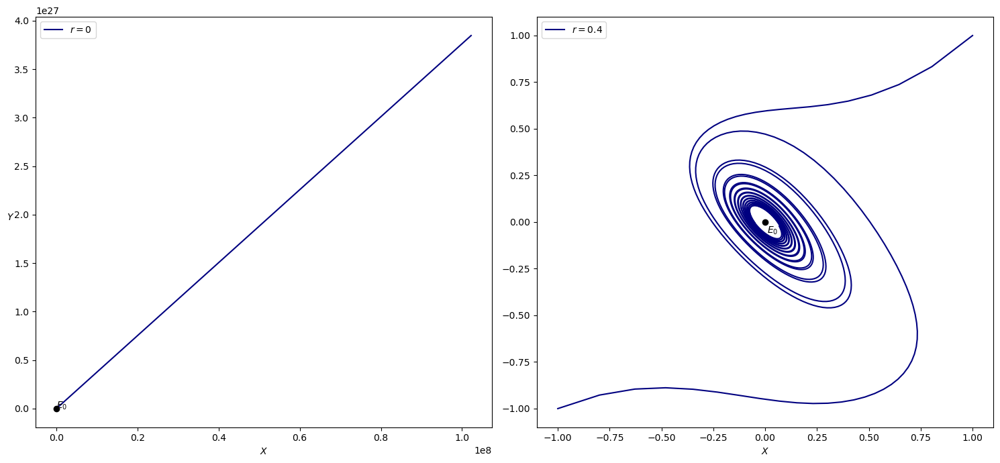

In [3]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r
r = 0.
system = Saltzmann_Maasch(r=r)
# simulate the system two times with different initial points
R1, time1 = system.simulateTraj((10, 10, 1), 100, 1000)
R2, time2 = system.simulateTraj((-1, -1, -1), 100, 1000)
# plot the trajectories
axs[0].plot(R1[0], R1[1], color='navy')
axs[0].plot(R2[0], R2[1], color='navy', label = r'$r=0$')
# display the equilibrium points using the formula above
E0 = (0,0)
axs[0].plot(E0[0], E0[1], 'o', color='black')
axs[0].text(E0[0]-0.05, E0[1]-0.08, r'$E_0$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of r
r = 0.4
system = Saltzmann_Maasch(r=r)
# simulate the system two times
R1, time1 = system.simulateTraj((1, 1, 1), 100, 1000)
R2, time2 = system.simulateTraj((-1, -1, -1), 100, 1000)
# plot the trajectories
axs[1].plot(R1[0], R1[1], color='navy')
axs[1].plot(R2[0], R2[1], color='navy', label = r'$r=0.4$')
# display the equilibrium points
E0 = (0,0)
axs[1].plot(E0[0], E0[1], 'o', color='black')
axs[1].text(E0[0]+0.01, E0[1]-0.06, r'$E_0$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

Now we can plot some **phase portraits** for the non-trivial equilibrium points $E_1, E_2$, which began to appear for $r>1.16$, as it can be seen from the formula:
$$
E_{1,2} = \left(-1.25Y_{1,2}, \ Y_{1,2}, \ 1.25Y_{1,2} \right), \quad \text{with} \quad Y_{1,2} = -0.3 \pm \sqrt{r - 1.16} \ \ .
$$

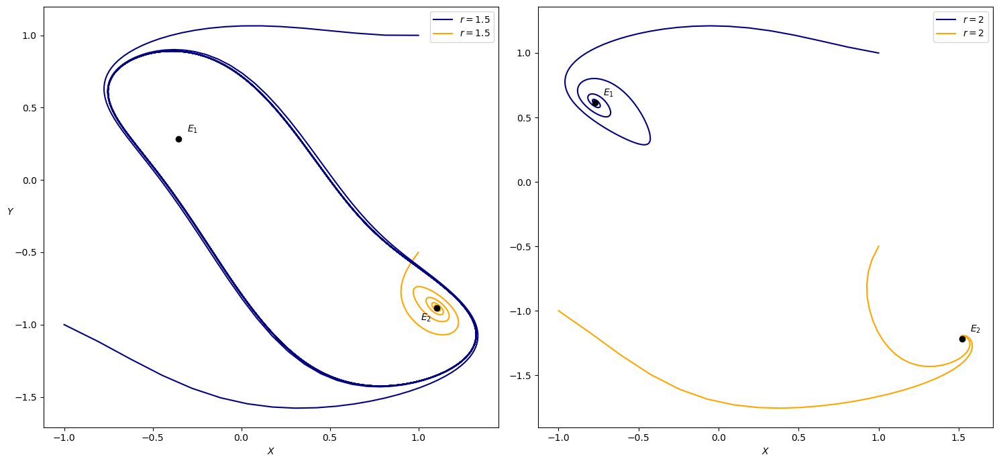

In [77]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r
r = 1.5
system = Saltzmann_Maasch(r=r)
# simulate the system for the same value of r, three times
# for three different initial conditions
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0.01), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# plot the resulting trajectories, differentiating the color
# in function of the equilibrium convergence
axs[0].plot(R1[0], R1[1], color='navy'  , label = r'$r=1.5$')
axs[0].plot(R2[0], R2[1], color='orange', label = r'$r=1.5$')
axs[0].plot(R3[0], R3[1], color='navy')
# display the equilibrium points using the formula above
E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
axs[0].plot(E1[0], E1[1], 'o', color='black')
axs[0].plot(E2[0], E2[1], 'o', color='black')
axs[0].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[0].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of the parameter r
r = 2.
system = Saltzmann_Maasch(r=r)
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# simulate the system three times again, using the same 
# initial points as in the case before
axs[1].plot(R1[0], R1[1], color='navy'  , label = r'$r=2$')
axs[1].plot(R2[0], R2[1], color='orange', label = r'$r=2$')
axs[1].plot(R3[0], R3[1], color='orange')
# display the equilibrium points
E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
axs[1].plot(E1[0], E1[1], 'o', color='black')
axs[1].plot(E2[0], E2[1], 'o', color='black')
axs[1].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[1].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

The behavior of the system, from the point of view of equilibria points, can be summarized with the following plot, which displays the attractors for different values of the parameter $r$. In particular, the system is simulated many times, starting from different initial points, for a number of steps that is large enough (to let the system reach the equilibrium). Then, only the final steps of the system's simulations are displayed, in order to reveal the attractive regions (or points) of the system. The result is the following plot:

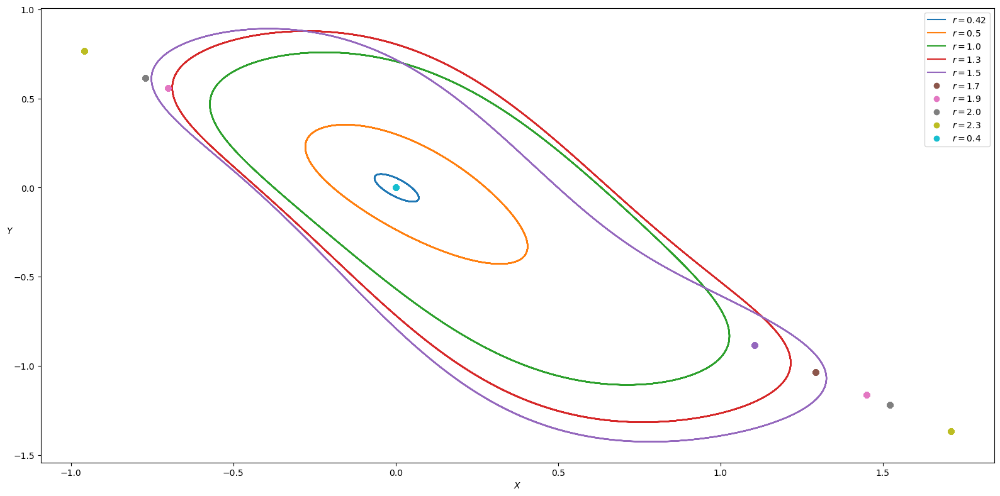

In [80]:
fig, ax = plt.subplots(figsize=(16,8))
color = iter(plt.cm.tab10(np.linspace(0, 1, 10)))

# define a set of values of the parameter r
for r in [0.42, 0.5, 1., 1.3, 1.5, 1.7, 1.9, 2., 2.3]:
    system = Saltzmann_Maasch(r=r)
    c = next(color)
    # simulate the system for 3 different initial conditions, 
    # already examined before to characterize the basins of attraction
    R1, _ = system.simulateTraj((1,1,0.01), 1000, 10000)
    # if the system has reached a single attractive equilibrium point, 
    # display that point
    if (abs(R1[1,-1]-R1[1,-10])<1e-8):
        ax.plot(R1[0, 9500:], R1[1, 9500:],'o', color=c, label=fr'$r={r}$')
    # otherwise the system is following a certain closed trajectory, 
    # called 'attractor' trajectory, which is then displayed
    else:
        ax.plot(R1[0, 9500:], R1[1, 9500:], color=c, label=fr'$r={r}$')
    # simulate the system with a second initial point
    R2, _ = system.simulateTraj((1,-0.5,0.01), 1000, 10000)
    if (abs(R2[1,-1]-R2[1,-10])<1e-8):
        ax.plot(R2[0, 9500:], R2[1, 9500:],'o', color=c, label=fr'$r={r}$')
    else:
        ax.plot(R2[0, 9500:], R2[1, 9500:], color=c, label=fr'$r={r}$')
    # simulate the system with a third initial point
    R3, _ = system.simulateTraj((-0.5,0.5,1.), 1000, 10000)
    if (abs(R3[1,-1]-R3[1,-10])<1e-8):
        ax.plot(R3[0, 9500:], R3[1, 9500:],'o', color=c, label=fr'$r={r}$')
    else:
        ax.plot(R3[0, 9500:], R3[1, 9500:], color=c, label=fr'$r={r}$')

# simulate the system also for the value r=0.4, as done in the previous plots.
# In this case we know that the system has only the trivial equilibrium point E_0, 
# which is reached in a finite time by the system
for r in [0.4]:
    system = Saltzmann_Maasch(r=r)
    R1, _ = system.simulateTraj((1, 1, 0), 1000, 10000)
    c = next(color)
    ax.plot(R1[0, 9500:], R1[1, 9500:], 'o', color=c, label=fr'$r={r}$')

# adjust the legend of labels
hand, labl = ax.get_legend_handles_labels()
handout=[]
lablout=[]
for h,l in zip(hand,labl):
   if l not in lablout:
        lablout.append(l)
        handout.append(h)
ax.legend(handout, lablout)

ax.set_xlabel(r'$X$')
ax.set_ylabel(r'$Y$', rotation=0)
plt.tight_layout()
plt.show()

In the next code box, the same graph as before is presented. The only difference is that now the starting points for the system simulation are taken with uniform distribution in the interval $[-1,1]$ (whereas before, the initial points were taken with different precise values, which were previously tested). By taking a sufficiently large number of initial points, the probability of drawing in the basin of attraction of all equilibrium points is very high.

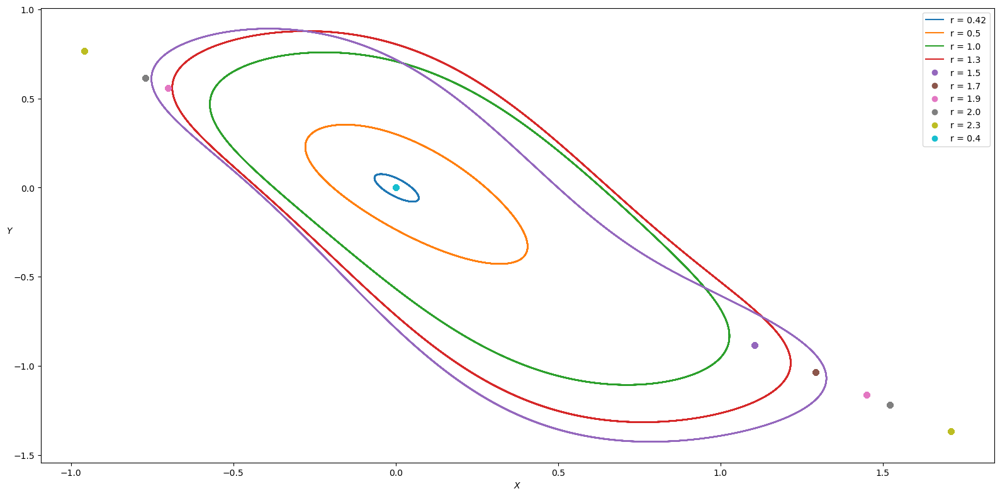

In [9]:
fig, ax = plt.subplots(figsize=(16,8))
color = iter(plt.cm.tab10(np.linspace(0, 1, 10)))

# define a set of values of the parameter r
for r in [0.42, 0.5, 1., 1.3, 1.5, 1.7, 1.9, 2., 2.3]:
    system = Saltzmann_Maasch(r=r)
    c = next(color)
    # simulate the system initializing the initial point
    # uniformly in the [-1,1]^3 cube, 10 or more times
    for _ in range(10):
        R0 = rng_0.uniform(low=-1,high=1, size=3)
        R1, time1 = system.simulateTraj(R0, 1000, 10000)
        if (abs(R1[1,-1]-R1[1,-50])<1e-14):
            ax.plot(R1[0, 9500:], R1[1, 9500:],'o', color=c, label=f'r = {r}')
        else:
            ax.plot(R1[0, 9500:], R1[1, 9500:], color=c, label=f'r = {r}')
            
# simulate the system also for the value r=0.4, as done in the previous plots.
# In this case we know that the system has only the trivial equilibrium point E_0, 
# which is reached in a finite time by the system
for r in [0.4]:
    system = Saltzmann_Maasch(r=r)
    R1, time1 = system.simulateTraj((1, 1, 0), 1000, 10000)
    c = next(color)
    ax.plot(R1[0, 9500:], R1[1, 9500:], 'o', color=c, label=f'r = {r}')
    
# adjust the legend
hand, labl = ax.get_legend_handles_labels()
handout=[]
lablout=[]
for h,l in zip(hand,labl):
   if l not in lablout:
        lablout.append(l)
        handout.append(h)
ax.legend(handout, lablout)

ax.set_xlabel(r'$X$')
ax.set_ylabel(r'$Y$', rotation=0)
plt.tight_layout()
plt.show()

The previous graph is highly significant. In fact, we can recognize different behaviors of the system, varying the bifurcation parameter $r$, in the framework fixed before, i.e with $p = 1, q = 2.5, v = 0.2, s = 0.6$. Wanting to make a rough estimate (more precise values will be find in the further analysis) we can state that:
- for values of $r<0.42$ the system has a unique stable, attractive equilibrium point, which is $E_0=(0,0,0)$, and this point is reached by the system in a finite number of steps. The system is then mono-stable. 
- around $r\approx 0.42$ the system encounters a bifurcation point: in fact, although the equilibrium points $E_1$ and $E_2$ described above do not yet appear (they appear for $r>1.16$), the equilibrium point $E_0$ is no more reached by the system in a finite time (i.e. in a finite number of steps). The system then ends up in a periodic limit cycle, evolving in a closed trajectory, i.e. an attractor trajectory. The system is mono-stable also in this parameter's region. We can look, for example, at the blue, orange and green trajectories, corresponding to $r=0.42, 0.5, 1.0$ respectively.
- at $r=1.16$ the two equilibrium points $E_1, E_2$ appear, but are initially unstable. The system remains then mono-stable with the periodic limit cycle as the unique attractor. We can argue this conclusion looking for example at the red trajectory, corresponding to $r=1.3$.
- in a neighboroud of $r=1.5$, the system becomes bi-stable. In fact, as we can see looking at the violet points, the equilibrium point $E_2$ becomes stable (and we can see that violet point in the graph), whereas the point $E_1$ is still unstable. However, there is also the presence of the periodic limit cycle as a stable attractor for the system, which is indeed bi-stable.
- in a neighboroud of $r=1.7$ (the unique brown point) the system becomes mono-stable. In this case the equilibrium point $E_2$ is stable, whereas $E_1$ is not even, and remains unstable. The system has no periodic limit cycles in this region, so it looses that attractor. 
- for values of $r>1.9$ approximately, the system becomes bi-stable again. In this case both $E_1$ and $E_2$ are stable equilibrium points (pink, gray and yellow dots, corresponding to $r=1.9, 2.0, 2.3$ respectively).

Now we can study some trajectories of the system, for different values of $r$, in order to see how the bifurcation parameter influences the **system's evolution in time**. In particular, it is possible to observe how the system's variables $X(t), Y(t), Z(t)$ follow periodic trajectories in time for values ​​of the bifurcation parameter $r$ which allows periodic limit cycles as attractors; while converging trajectories to a single point of stable equilibrium are observed in other cases. In the following boxes of code, the time evolution of the three variables $X(t), Y(t), Z(t)$ is displayed for two values of $r$: $r=1.3, r=2.0$. As seen before, for $r=1.3$, the system is monostable, with the periodic limit cycle as unique attractor of the system, and the two equilibrium points $E_1, E_2$ unstable. We expect in this case a periodic time behavior of the system's variables. In the latter case, for $r=2.0$, the system is bistable, with $E_1, E_2$ stable equilibrium points, and without periodic limit cycles. In this case we expect a converging behavior of the variables $X(t), Y(t), Z(t)$ to one equilibrium point among $E_1, E_2$. Then, for both the values of $r$, the system is simulated multiple times (sampling the starting point uniformly inside the $[-1, 1]^3$ cube), and the histogram of final points (after the evolution) is made. If the system evolves for a number of steps that is large enough, that histogram approximates the **steady state probability distribution**.

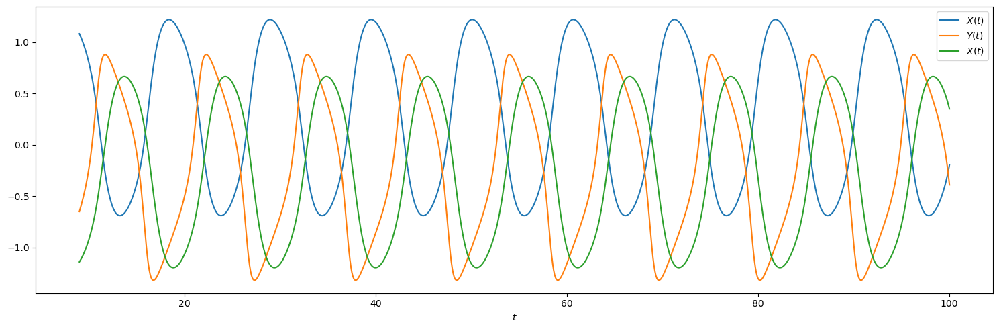

In [10]:
# instantiate the class object for the system with a value r = 1.3
system = Saltzmann_Maasch(r=1.3)
# simulate the trajectory for a certain initial point (1,1,1)
R, time = system.simulateTraj((1, 1, 1), 100, 1000)

plt.figure(figsize=(15, 5))
plt.xlabel(r'$t$')
plt.plot(time[90:], R[0,90:], label=r'$X(t)$')
plt.plot(time[90:], R[1,90:], label=r'$Y(t)$')
plt.plot(time[90:], R[2,90:], label=r'$X(t)$')
plt.legend()
plt.tight_layout()
plt.show()

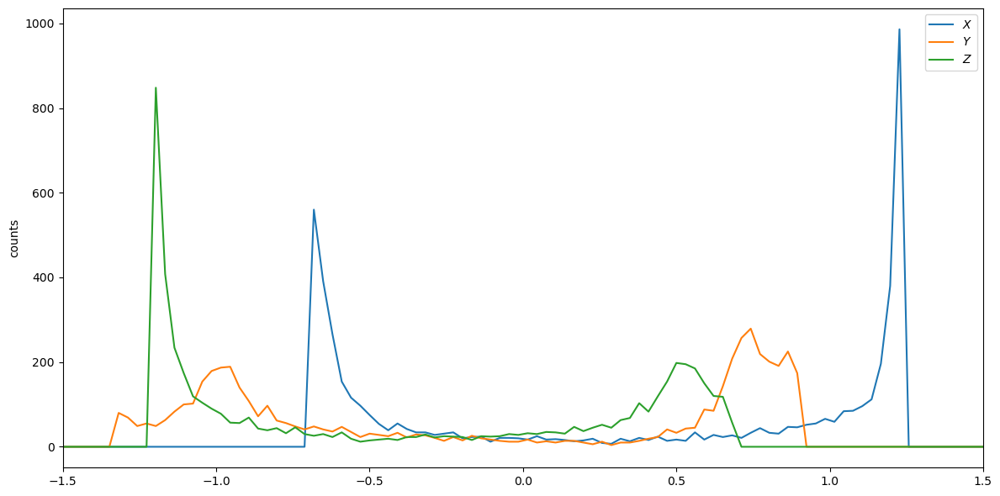

In [20]:
# set the value of the bifurcation parameter r = 1.3, as before
r = 1.3
# set the interval in which the initial values of the variables X, Y, Z 
# are sampled for starting the simulation
I_0 = [-1, 1]
# set the interval of the histogram
I_hist = [-1.5, 1.5]
# set the number of bins for the histogram, and the number of simulations
Nbins = 100
Nsim = 5000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch(r=r)
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

# run the simulations of the system
for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj(rng_0.uniform(low=I_0[0],high=I_0[1],size=3), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated steady state probability distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

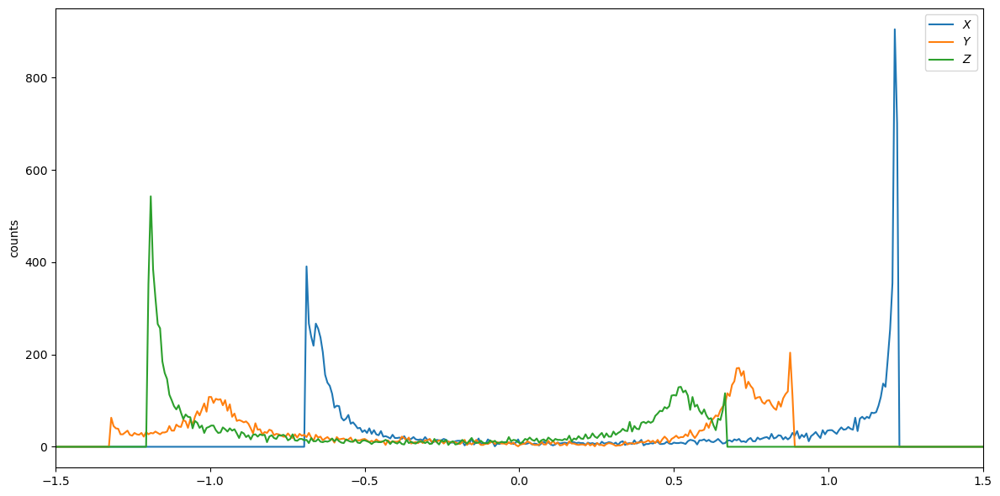

In [206]:
# display a more refined histogram with the same value r = 1.3 (more bins and simulations)
r = 1.3
I_0 = [-1, 1]
I_hist = [-1.5, 1.5]
Nbins = 400
Nsim = 10000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch(r=r)
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj(rng_0.uniform(low=I_0[0],high=I_0[1],size=3), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated steady state probability distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

The obtained result is exactly what expected: the variables of the dynamical system $X(t), Y(t), Z(t)$ follow a periodic time behavior. Indeed, for $r=1.3$, the system is monostable with the periodic limit cycle as unique attractor. For $r=2$ we have instead:

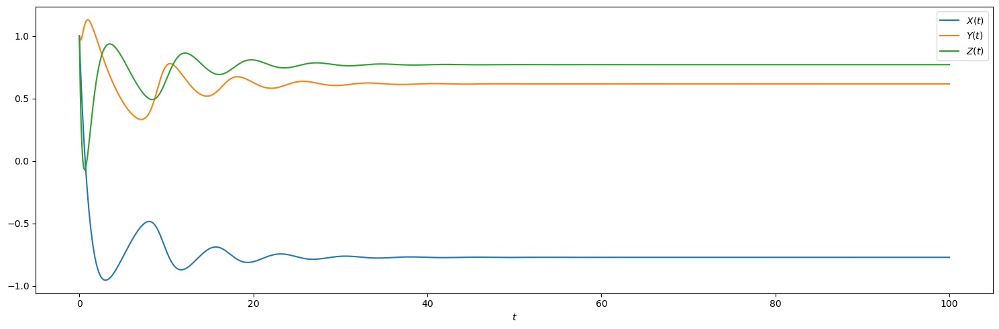

In [14]:
# instantiate the class object for the system with a value r = 2.0
system = Saltzmann_Maasch(r=2.)
# simulate the trajectory for a certain initial point (1,1,1)
R, time = system.simulateTraj((1, 1, 1), 100, 1000)

plt.figure(figsize=(15, 5))
plt.plot(time[:], R[0,:], label=r'$X(t)$')
plt.plot(time[:], R[1,:], label=r'$Y(t)$')
plt.plot(time[:], R[2,:], label=r'$Z(t)$')

plt.xlabel(r'$t$')
plt.legend()
plt.tight_layout()
plt.show()

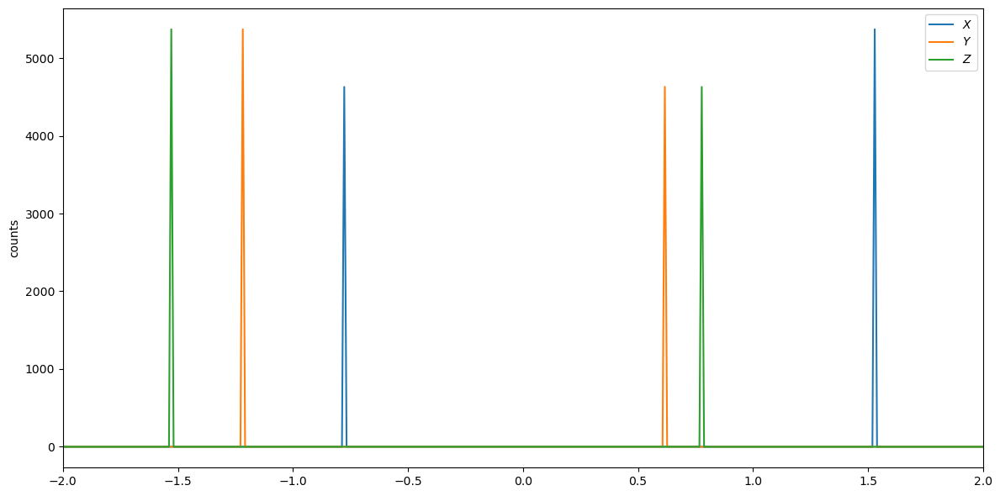

In [205]:
# set the value of the bifurcation parameter r = 2.0, as before
r = 2.
# set the interval in which the initial values of the variables X, Y, Z 
# are sampled for starting the simulation
I_0 = [-1, 1]
# set the interval of the histogram
I_hist = [-2., 2.]
# set the number of bins for the histogram, and the number of simulations
Nbins = 400
Nsim = 10000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch(r=r)
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj(rng_0.uniform(low=I_0[0],high=I_0[1],size=3), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

Also in this case the result is perfectly compatible with what expected. In fact the trajectory of the variables $X(t), Y(t), Z(t)$ is converging to the equilibrium point $E_1$. The histogram above states the same conclusion, since the steady state probability distributions (which is given by the histogram) are peaked into the two stable attractive equilibrium points $E_1$ and $E_2$, that are given by
$$
E_{1,2} = \left(-1.25Y_{1,2}, \ Y_{1,2}, \ 1.25Y_{1,2} \right), \quad \text{with} \quad Y_{1,2} = -0.3 \pm \sqrt{r - 1.16} \ \ .
$$
In this case, for $r=2$, we have:
$$
E_1 = (-0.771, 0.616, 0.771) \ , \quad E_2 = (1.521, -1.216, -1.521) \ \ ,
$$
which are exactly the values corresponding to the peaks in the histogram.


The final step of the analysis of the Saltzman-Maasch deterministic dynamical system is to produce a more detailed bifurcation diagram.

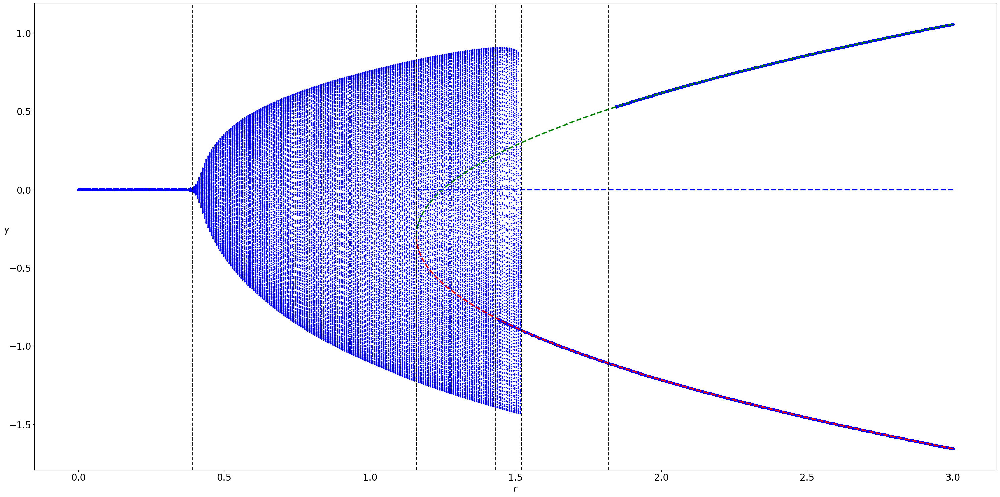

In [24]:
# create the bifurcation diagram
fig = plt.figure(figsize=(30,15))
r_vals = np.linspace(0., 3., 500)
for r in r_vals:
    system = Saltzmann_Maasch(r=r)

    R0 = (1, 1, 0.01)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-3])<1e-5):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='blue')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='blue')

    R0 = (1., -0.5, 0.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-4):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='blue')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='blue')

    R0 = (-0.5, 0.5, 1.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-4):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='blue')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='blue')

x = np.linspace(1.16, 3, 1000)
plt.plot(x, -0.3-np.sqrt(x-1.16), ls='--', color='red',   lw=3)
plt.plot(x, -0.3+np.sqrt(x-1.16), ls='--', color='green',  lw=3)
plt.plot(x, [0]*len(x),           ls='--', color='blue',  lw=3)

plt.axvline(x=0.39, ls='--', color='black', lw=2)
#plt.axvline(x=0.42, ls='--', color='black', lw=2)
plt.axvline(x=1.16, ls='--', color='black', lw=2)
plt.axvline(x=1.43, ls='--', color='black', lw=2)
plt.axvline(x=1.52, ls='--', color='black', lw=2)
plt.axvline(x=1.82, ls='--', color='black', lw=2)

#ax.fill_between(x, 0, 1, where=y < -theta, facecolor='red', alpha=0.5, transform=trans)

plt.xlabel(r'$r$', fontsize=20)
plt.ylabel(r'$Y$', fontsize=20, rotation=0)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()

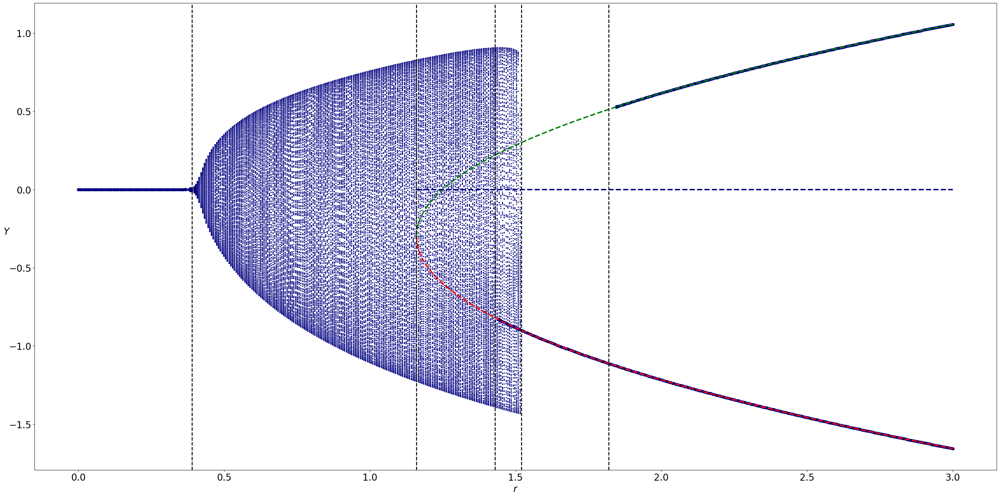

In [22]:
# create the bifurcation diagram
fig = plt.figure(figsize=(30,15))
r_vals = np.linspace(0., 3., 500)
for r in r_vals:
    system = Saltzmann_Maasch(r=r)

    R0 = (1, 1, 0.01)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-3])<1e-5):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

    R0 = (1., -0.5, 0.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-4):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

    R0 = (-0.5, 0.5, 1.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-4):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

x = np.linspace(1.16, 3, 1000)
plt.plot(x, -0.3-np.sqrt(x-1.16), ls='--', color='red',   lw=3)
plt.plot(x, -0.3+np.sqrt(x-1.16), ls='--', color='green', lw=3)
plt.plot(x, [0]*len(x),           ls='--', color='navy',  lw=3)

plt.axvline(x=0.39, ls='--', color='black', lw=2)
#plt.axvline(x=0.42, ls='--', color='black', lw=2)
plt.axvline(x=1.16, ls='--', color='black', lw=2)
plt.axvline(x=1.43, ls='--', color='black', lw=2)
plt.axvline(x=1.52, ls='--', color='black', lw=2)
plt.axvline(x=1.82, ls='--', color='black', lw=2)

#ax.fill_between(x, 0, 1, where=y < -theta, facecolor='red', alpha=0.5, transform=trans)

plt.xlabel(r'$r$', fontsize=20)
plt.ylabel(r'$Y$', fontsize=20, rotation=0)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()

Looking at the previous diagram, we can state significant conclusions, refining the numerical values found before. Here, the equilibrium points $E_0, E_1$ and $E_2$ are shown by the blue, green and red lines. The stable and unstable equilibria are shown by the solid and dashed lines with corresponding colors. Therefore we can state that the trivial equilibrium $E_0 = (0, 0, 0)$ is stable for $r < r_1 = 0.41704$. At $r = r_1$ , the deterministic system undergoes a bifurcation (Andronov-Hopf bifurcation) with the birth of a stable limit cycle. This cycle loses its stability at $r_4 = 1.517$. The equilibria $E_1, E_2$ appearing at $r = r_2 = 1.16$ are unstable at ﬁrst. The equilibrium $E_2$ becomes stable as the parameter $r$ increases and crosses the value $r_3 = 1.42271$ whereas the equilibrium $E_1$ becomes stable as the parameter $r$ increases and crosses the value $r_5 = 1.82025$.

- In the parametric region $0 < r < r_1$, the system is monostable with the trivial equilibrium $E_0$ as a single attractor. 
- In the zone $r_1 < r < r_3$ , the climate system is monostable with the stable limit cycle as a single attractor. 
- For $r_3 < r < r_4$, the system is bistable with two coexisting attractors, namely the equilibrium $E_2$ and the limit cycle. 
- For $r_4 < r < r_5$ , the deterministic system is monostable with the equilibrium $E_2$ representing a single attractor. 
- If $r > r_5$ , the system is bistable with two coexisting stable equilibria $E_1$ and $E_2$. 

Frequently, the climate ﬂuctuations are explained by the presence of a limit cycle in the corresponding mathematical model. For example, in this model, the oscillations in the ice mass, carbon dioxide concentration, and mean ocean temperature are caused due to the existence of a stable limit cycle. Indeed, in the parametric zone $r_1 < r < r_4$, the phenomenon of self-oscillations is observed. However, the climate oscillations can be caused not only by the self-oscillations in the deterministic model. Another reason studied below is the random disturbances generating the oscillatory regimes in equilibrium zones even in cases of small noise intensities.

## Stochastic dynamical system

Now a stochastic dynamics is introduced, in order to reveal new features of noise-induced climate variability. To do so, we can introduce in the model a multiplicative white gaussian noise term in the third equation. In this way, the system of differential equations with the stochastic term is given by:
$$
\begin{cases}
    \dot{X} = -X -Y -vZ \\ 
    \dot{Y} = -pZ + rY -sY^2 -Y^3 \\
    \dot{Z} = -q(X+Z) + \epsilon Z \xi(t) \ \ ,
\end{cases}
$$
where $\xi(t)$ is a multiplicative white gaussian noise term.

It will be shown that the climate system can be highly noise excitable and it possesses the large-amplitude ﬂuctuations even in those regions where the deterministic model does not contain any self-sustained oscillations. Intermittent fluctuations in both small and large amplitudes between different basins of attraction of a limit cycle and stable equilibria significantly influence the climate state, causing transitions from warm to cold and vice versa at various noise intensities. Sudden jumps between the basins of attraction of two stable equilibria, corresponding to warm and cold climate states, are statistically confirmed within a specific range of noise intensities. The climate system experiences transitions between its equilibria when noise is present in its prognostic variables. Moreover, the likelihood of these transitions increases with higher noise intensity.

The first thing that can be done is to reproduce the same plots and graphs of the deterministic case, but adding the white noise term, in order to see the differences. For example we can choose a value of the noise parameter $\epsilon=0.3$.

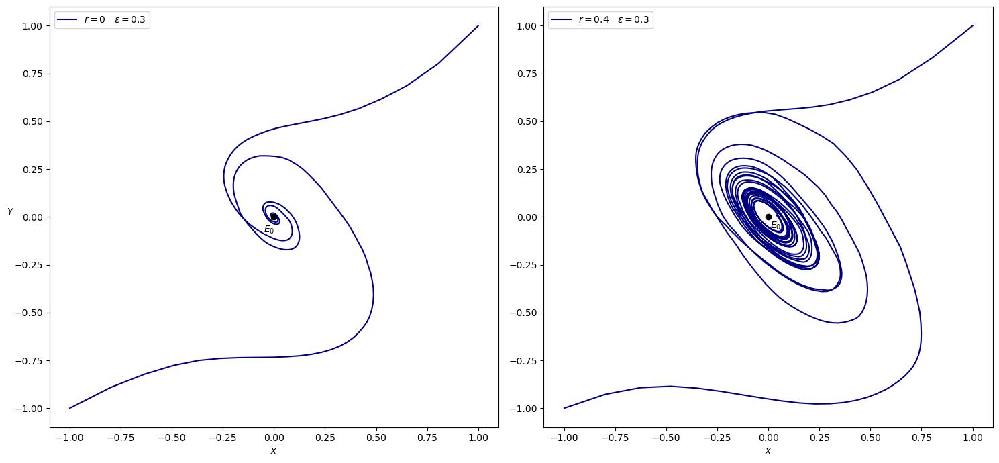

In [88]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r, and the noise term eps
r = 0. ; eps = 0.3
system = Saltzmann_Maasch(r=r, eps=eps)
# simulate the system two times with different initial points
R1, time1 = system.simulateTraj((1, 1, 1), 100, 1000)
R2, time2 = system.simulateTraj((-1, -1, -1), 100, 1000)
# plot the trajectories
axs[0].plot(R1[0], R1[1], color='navy')
axs[0].plot(R2[0], R2[1], color='navy', label = r'$r=0 \quad \epsilon=0.3$')
# display the equilibrium points using the formula above
E0 = (0,0)
axs[0].plot(E0[0], E0[1], 'o', color='black')
axs[0].text(E0[0]-0.05, E0[1]-0.08, r'$E_0$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of r
r = 0.4
system = Saltzmann_Maasch(r=r, eps=eps)
# simulate the system two times
R1, time1 = system.simulateTraj((1, 1, 1), 100, 1000)
R2, time2 = system.simulateTraj((-1, -1, -1), 100, 1000)
# plot the trajectories
axs[1].plot(R1[0], R1[1], color='navy')
axs[1].plot(R2[0], R2[1], color='navy', label = r'$r=0.4 \quad \epsilon=0.3$')
# display the equilibrium points
E0 = (0,0)
axs[1].plot(E0[0], E0[1], 'o', color='black')
axs[1].text(E0[0]+0.01, E0[1]-0.06, r'$E_0$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

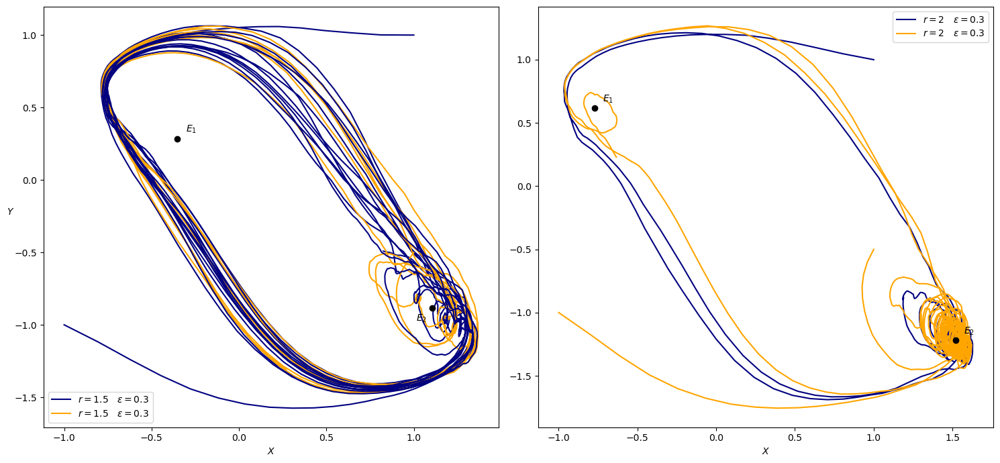

In [126]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r and the noise term eps
r = 1.5 ; eps=0.3
system = Saltzmann_Maasch(r=r, eps=eps)
# simulate the system for the same value of r, three times
# for three different initial conditions
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0.01), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# plot the resulting trajectories, differentiating the color
# in function of the equilibrium convergence
axs[0].plot(R1[0], R1[1], color='navy'  , label = r'$r=1.5 \quad \epsilon=0.3$')
axs[0].plot(R2[0], R2[1], color='orange', label = r'$r=1.5 \quad \epsilon=0.3$')
axs[0].plot(R3[0], R3[1], color='navy')
# display the equilibrium points using the formula above
E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
axs[0].plot(E1[0], E1[1], 'o', color='black')
axs[0].plot(E2[0], E2[1], 'o', color='black')
axs[0].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[0].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of the parameter r
r = 2.
system = Saltzmann_Maasch(r=r, eps=eps)
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# simulate the system three times again, using the same 
# initial points as in the case before
axs[1].plot(R1[0], R1[1], color='navy'  , label = r'$r=2 \quad \epsilon=0.3$')
axs[1].plot(R2[0], R2[1], color='orange', label = r'$r=2 \quad \epsilon=0.3$')
axs[1].plot(R3[0], R3[1], color='orange')
# display the equilibrium points
E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
axs[1].plot(E1[0], E1[1], 'o', color='black')
axs[1].plot(E2[0], E2[1], 'o', color='black')
axs[1].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[1].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

Already from this figure, we can see the presence of a noise-induced transition phenomenon. In fact, in the noiseless case with the same parameters and $r=2$ (right figure), the trajectories converged to the two stable equilibrium points $E_1$ and $E_2$. In the case with noise, however, the trajectories do not converge at the two equilibrium points but follow a periodic limit cycle trajectory.

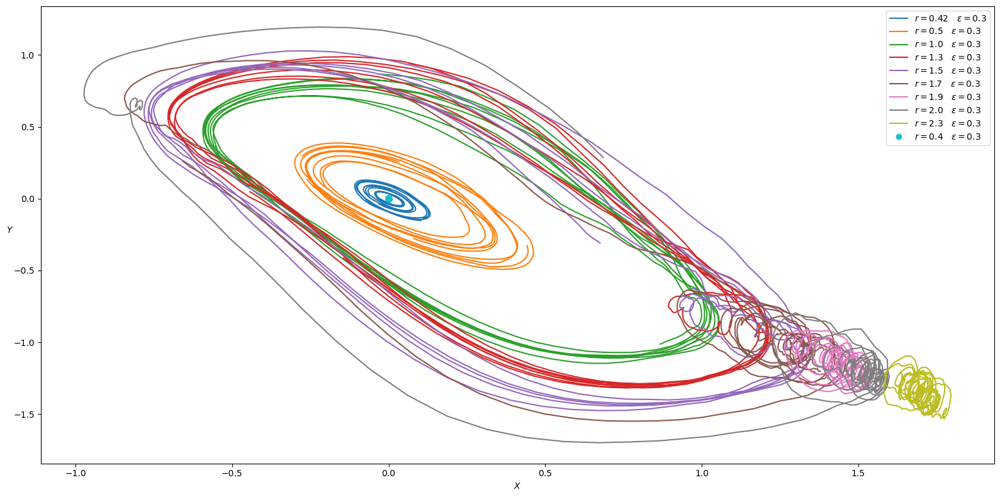

In [137]:
fig, ax = plt.subplots(figsize=(16,8))
color = iter(plt.cm.tab10(np.linspace(0, 1, 10)))

# define the noise term
eps = 0.3
# define a set of values of the parameter r
for r in [0.42, 0.5, 1., 1.3, 1.5, 1.7, 1.9, 2., 2.3]:
    system = Saltzmann_Maasch(r=r, eps=eps)
    c = next(color)
    # simulate the system for 3 different initial conditions, 
    # already examined before to characterize the basins of attraction
    R1, _ = system.simulateTraj((1,1,0.01), 1000, 10000)
    # if the system has reached a single attractive equilibrium point, 
    # display that point
    if (abs(R1[1,-1]-R1[1,-10])<1e-8):
        ax.plot(R1[0, 9750:], R1[1, 9750:],'o', color=c, label=fr'$r={r} \quad \epsilon={eps}$')
    # otherwise the system is following a certain closed trajectory, 
    # called 'attractor' trajectory, which is then displayed
    else:
        ax.plot(R1[0, 9750:], R1[1, 9750:], color=c, label=fr'$r={r} \quad \epsilon={eps}$')
    # simulate the system with a second initial point
    R2, _ = system.simulateTraj((1,-0.5,0.01), 1000, 10000)
    if (abs(R2[1,-1]-R2[1,-10])<1e-8):
        ax.plot(R2[0, 9750:], R2[1, 9750:],'o', color=c, label=fr'$r={r} \quad \epsilon={eps}$')
    else:
        ax.plot(R2[0, 9750:], R2[1, 9750:], color=c, label=fr'$r={r} \quad \epsilon={eps}$')
    # simulate the system with a third initial point
    R3, _ = system.simulateTraj((-0.5,0.5,1.), 1000, 10000)
    if (abs(R3[1,-1]-R3[1,-10])<1e-8):
        ax.plot(R3[0, 9750:], R3[1, 9750:],'o', color=c, label=fr'$r={r} \quad \epsilon={eps}$')
    else:
        ax.plot(R3[0, 9750:], R3[1, 9750:], color=c, label=fr'$r={r} \quad \epsilon={eps}$')

# simulate the system also for the value r=0.4, as done in the previous plots.
# In this case we know that the system has only the trivial equilibrium point E_0, 
# which is reached in a finite time by the system
for r in [0.4]:
    system = Saltzmann_Maasch(r=r, eps=eps)
    R1, _ = system.simulateTraj((1, 1, 0), 1000, 10000)
    c = next(color)
    ax.plot(R1[0, 9750:], R1[1, 9750:], 'o', color=c, label=fr'$r={r} \quad \epsilon={eps}$')

# adjust the legend of labels
hand, labl = ax.get_legend_handles_labels()
handout=[]
lablout=[]
for h,l in zip(hand,labl):
   if l not in lablout:
        lablout.append(l)
        handout.append(h)
ax.legend(handout, lablout)

ax.set_xlabel(r'$X$')
ax.set_ylabel(r'$Y$', rotation=0)
plt.tight_layout()
plt.show()

Now simulate a bunch of trajectories for the variables $X(t), Y(t), Z(t)$, and display the resulting histograms approximating the steady state probability distributions.

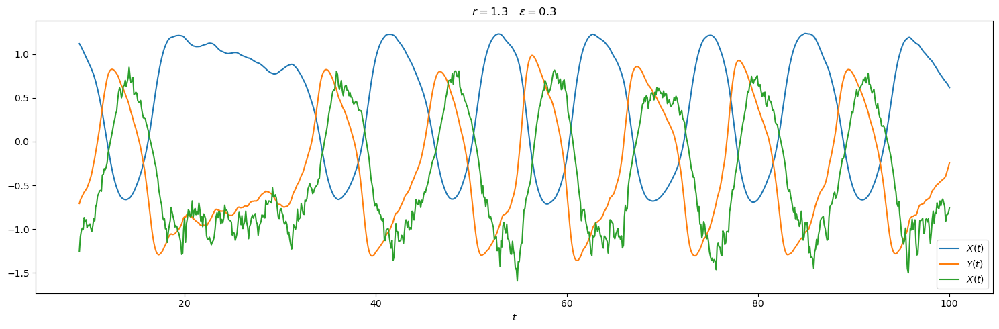

In [151]:
# instantiate the class for the system with a value r = 1.3, eps=0.3
system = Saltzmann_Maasch(r=1.3, eps=0.3)
# simulate the trajectory for a certain initial point (1,1,1)
R, time = system.simulateTraj((1, 1, 1), 100, 1000)

plt.figure(figsize=(15, 5))
plt.xlabel(r'$t$')
plt.plot(time[90:], R[0,90:], label=r'$X(t)$')
plt.plot(time[90:], R[1,90:], label=r'$Y(t)$')
plt.plot(time[90:], R[2,90:], label=r'$X(t)$')
plt.title(r'$r=1.3 \quad \epsilon=0.3$')
plt.legend()
plt.tight_layout()
plt.show()

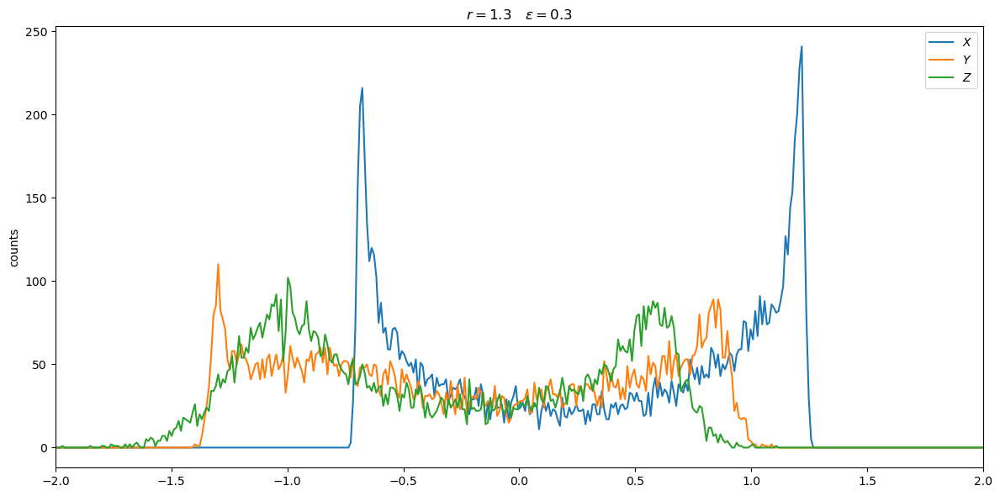

In [204]:
# set the value of the bifurcation parameter r = 1.3 and eps = 0.3
r = 1.3 ; eps = 0.3
# set the interval in which the initial values of the variables X, Y, Z 
# are sampled for starting the simulation
I_0 = [-1, 1]
# set the interval of the histogram
I_hist = [-2., 2.]
# set the number of bins for the histogram, and the number of simulations
Nbins = 400
Nsim = 10000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch(r=r, eps=eps)
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

# run the simulations of the system
for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj(rng_0.uniform(low=I_0[0],high=I_0[1],size=3), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated steady state probability distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')
plt.title(r'$r=1.3 \quad \epsilon=0.3$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

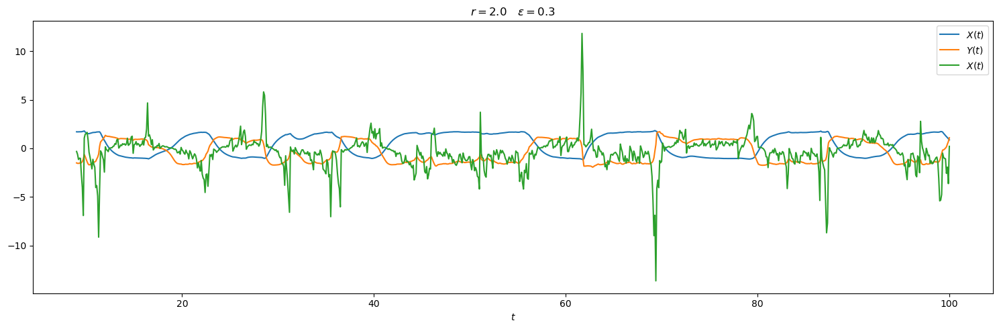

In [65]:
# instantiate the class for the system with a value r = 2.0, eps=0.3
system = Saltzmann_Maasch(r=2.0, eps=2)
# simulate the trajectory for a certain initial point (1,1,1)
R, time = system.simulateTraj((1, 1, 1), 100, 1000)

plt.figure(figsize=(15, 5))
plt.xlabel(r'$t$')
plt.plot(time[90:], R[0,90:], label=r'$X(t)$')
plt.plot(time[90:], R[1,90:], label=r'$Y(t)$')
plt.plot(time[90:], R[2,90:], label=r'$X(t)$')
plt.title(r'$r=2.0 \quad \epsilon=0.3$')
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipykernel_33503/1749601543.py:62: RuntimeWarning: overflow encountered in scalar power
  -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt
/tmp/ipykernel_33503/1749601543.py:62: RuntimeWarning: invalid value encountered in scalar subtract
  -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt


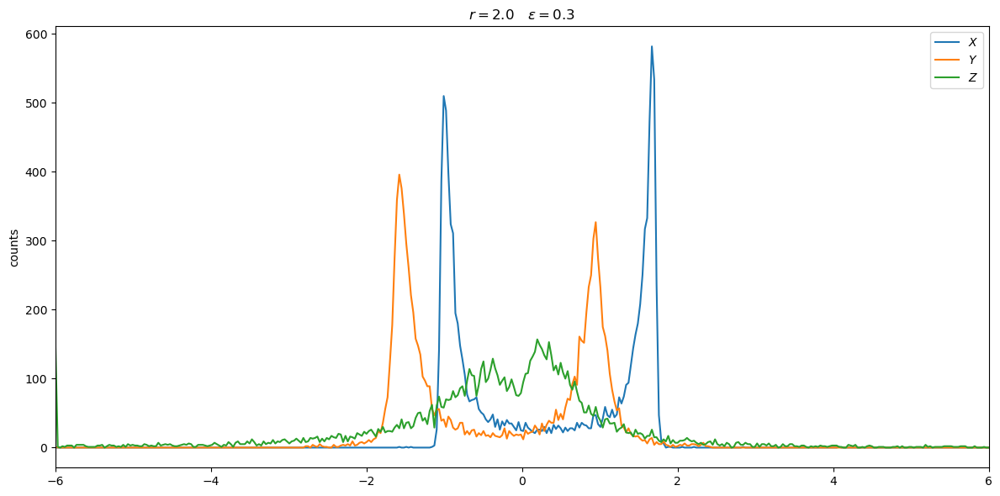

In [56]:
# set the value of the bifurcation parameter r = 2.0, and eps = 0.3
r = 2.0 ; eps = 2
# set the interval in which the initial values of the variables X, Y, Z 
# are sampled for starting the simulation
I_0 = [-1, 1]
# set the interval of the histogram
I_hist = [-6., 6.]
# set the number of bins for the histogram, and the number of simulations
Nbins = 400
Nsim = 10000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch(r=r, eps=eps)
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

# run the simulations of the system
for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj(rng_0.uniform(low=I_0[0],high=I_0[1],size=3), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated steady state probability distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')
plt.title(r'$r=2.0 \quad \epsilon=0.3$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipykernel_33503/1749601543.py:62: RuntimeWarning: overflow encountered in scalar power
  -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt
/tmp/ipykernel_33503/1749601543.py:62: RuntimeWarning: invalid value encountered in scalar subtract
  -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt


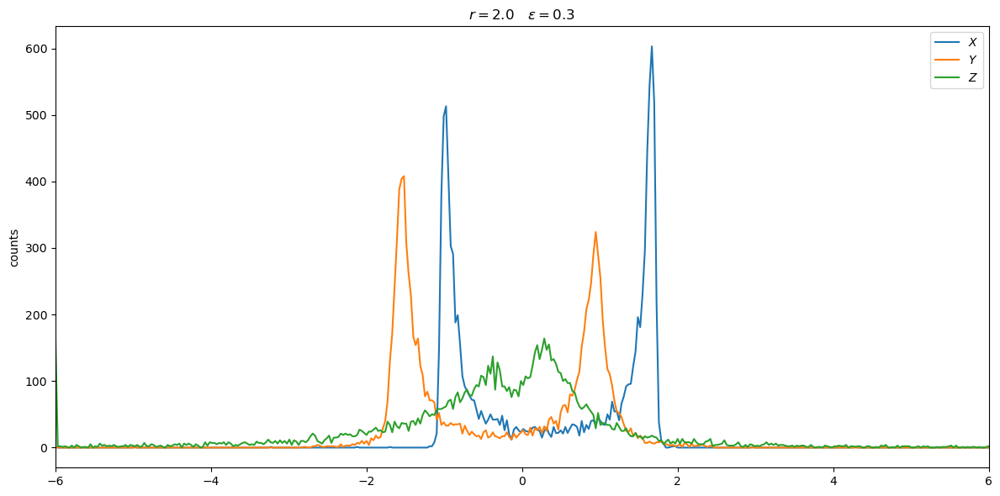

In [66]:
# set the value of the bifurcation parameter r = 2.0, and eps = 0.3
r = 2.0 ; eps = 2
# set the interval in which the initial values of the variables X, Y, Z 
# are sampled for starting the simulation
I_0 = [-1, 1]
# set the interval of the histogram
I_hist = [-6., 6.]
# set the number of bins for the histogram, and the number of simulations
Nbins = 400
Nsim = 10000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch(r=r, eps=eps)
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

# run the simulations of the system
for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj((0.5,-0.5,0), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated steady state probability distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')
plt.title(r'$r=2.0 \quad \epsilon=0.3$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipykernel_33503/1749601543.py:62: RuntimeWarning: overflow encountered in scalar power
  -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt
/tmp/ipykernel_33503/1749601543.py:62: RuntimeWarning: invalid value encountered in scalar subtract
  -self.p*Z +self.r*Y -self.s*(Y**2) -Y**3,   # ... dy/dt
/tmp/ipykernel_33503/1749601543.py:86: RuntimeWarning: overflow encountered in multiply
  return dt*(k_1 + 2*k_2 + 2*k_3 + k_4)/6


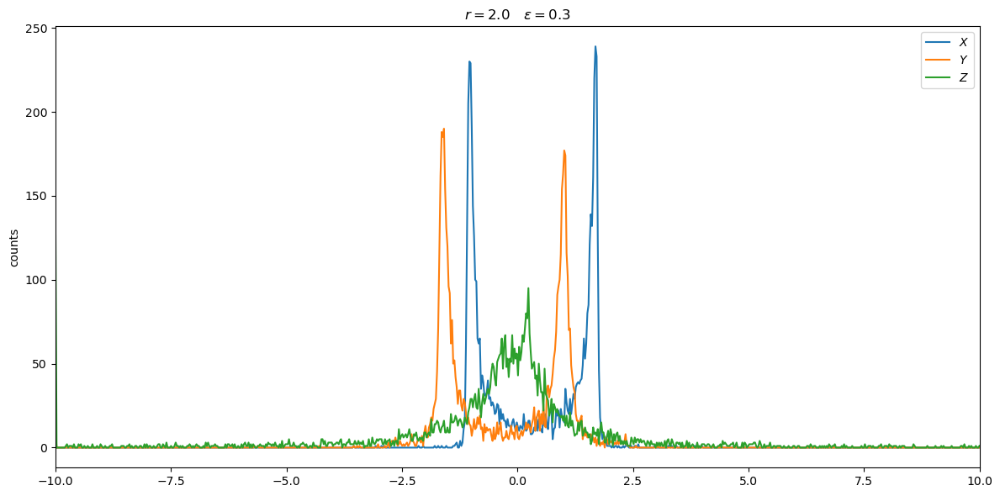

In [35]:
# set the value of the bifurcation parameter r = 2.0, and eps = 0.3
r = 2.0 ; eps = 3
# set the interval in which the initial values of the variables X, Y, Z 
# are sampled for starting the simulation
I_0 = [-1, 1]
# set the interval of the histogram
I_hist = [-10., 10.]
# set the number of bins for the histogram, and the number of simulations
Nbins = 800
Nsim = 10000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch(r=r, eps=eps)
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

# run the simulations of the system
for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj(rng_0.uniform(low=I_0[0],high=I_0[1],size=3), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated steady state probability distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')
plt.title(r'$r=2.0 \quad \epsilon=0.3$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

The previous plots confirm the same intuition made above: in the noiseless case, with $r=2$, the trajectory of the system is convergent to a stable equilibrium point (one between $E_1$ and $E_2$) and the histogram representing the stationary probability distribution approximate the action of three Dirac deltas (for $X, Y, Z$ variables) for each of the two equilibrium points. In the noise case, with $r=2, \epsilon=0.3$, the trajectory of the system is no more convergent but periodic, and indeed the stable attractor of the system, in this case, is similar to a periodic limit cycle. We have found a case, a combination of parameters, in which the noise presence induces a stable attractor of the system that is not present in the noiseless case. This is exactly a **NIT** phenomenon. In the following steps, this analysis will be deepened.

It is very interesting seeing how the bifurcation diagram changes under the effects of gaussian noise:

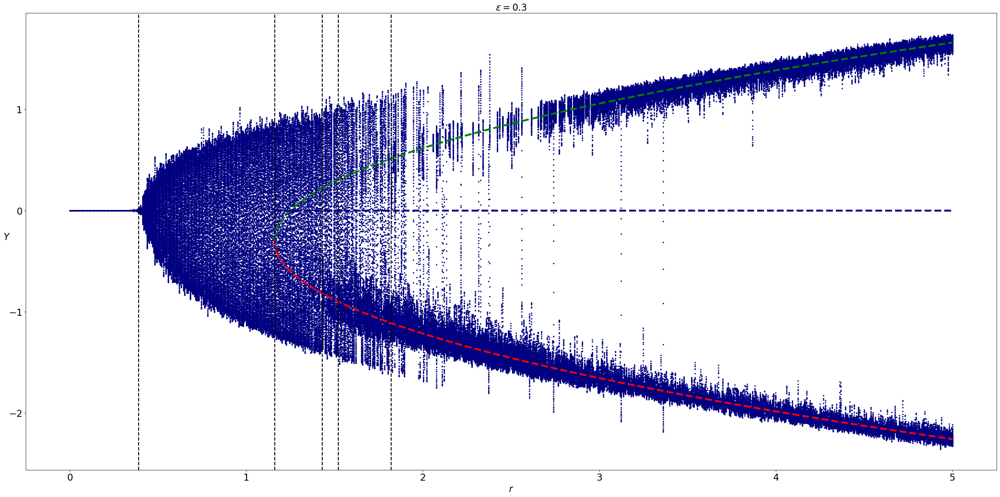

In [209]:
# create the bifurcation diagram
fig = plt.figure(figsize=(30,15))
eps = 0.3
r_vals = np.linspace(0., 5., 800)
for r in r_vals:
    system = Saltzmann_Maasch(r=r, eps=eps)

    R0 = (1, 1, 0.01)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-3])<1e-15):
        plt.plot(r, [R[1, 2400:]], ls='', ms=4, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=4, marker='.', color='navy')

    R0 = (1., -0.5, 0.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-14):
        plt.plot(r, [R[1, 2400:]], ls='', ms=4, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=4, marker='.', color='navy')

    R0 = (-0.5, 0.5, 1.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-14):
        plt.plot(r, [R[1, 2400:]], ls='', ms=4, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=4, marker='.', color='navy')

x = np.linspace(1.16, 5, 1000)
plt.plot(x, -0.3-np.sqrt(x-1.16), ls='--', color='red',   lw=4)
plt.plot(x, -0.3+np.sqrt(x-1.16), ls='--', color='green', lw=4)
plt.plot(x, [0]*len(x),           ls='--', color='navy',  lw=4)

plt.axvline(x=0.39, ls='--', color='black', lw=2)
#plt.axvline(x=0.42, ls='--', color='black', lw=2)
plt.axvline(x=1.16, ls='--', color='black', lw=2)
plt.axvline(x=1.43, ls='--', color='black', lw=2)
plt.axvline(x=1.52, ls='--', color='black', lw=2)
plt.axvline(x=1.82, ls='--', color='black', lw=2)

plt.xlabel(r'$r$', fontsize=20)
plt.ylabel(r'$Y$', fontsize=20, rotation=0)
plt.title(fr'$\epsilon={eps}$', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()

#### Noise induced transitions (NITs)

In the following section, we aim to investigate better the phenomenon of the noise-induced transitions.

Below, we demonstrate how increasing noise levels deform equilibrium regimes. Specifically, we consider the trajectories of the stochastic system starting from points that, in the deterministic case, converge to the equilibria $E_1$ or $E_2$ (i.e. inside the basins of attraction). The deterministic background of these stochastic phenomena is clarified by the phase portraits of the deterministic climate system shown in the right panel of all the following figures.

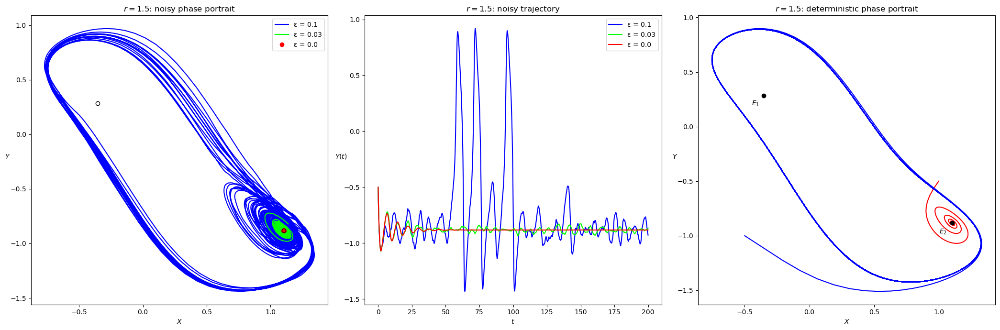

In [45]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 1.5

E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))

eps = 0.1
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=f'ε = {eps}')

eps = 0.03
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=f'ε = {eps}')

eps = 0.
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], 'o', color='red', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=f'ε = {eps}')
axs[2].plot(R[0,:], R[1,:], color='red', label=f'ε = {eps}')

# refine the first two graphs
axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle='none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle='none')
axs[0].set_xlabel(r'$X$'); axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$'); axs[1].set_ylabel(r'$Y(t)$', rotation=0)

R2, time2 = system.simulateTraj((-0.5, -1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='blue', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E1[0]-0.09, E1[1]-0.09, r'$E_1$')
axs[2].text(E2[0]-0.1, E2[1]-0.1, r'$E_2$')
axs[2].set_xlabel(r'$X$'); axs[2].set_ylabel(r'$Y$', rotation=0)

axs[0].legend()
axs[1].legend()
axs[0].set_title(fr'$r={r}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}$: noisy trajectory')
axs[2].set_title(fr'$r={r}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

First, we analyze the bistability zone $r_3 < r < r_4$. In the left and middle panels of the previous figure, we illustrate the phase trajectories in the $X-Y$ plane and the time series of solutions for the system with $r = 1.5$. For weak noise, $\epsilon=0.03$, the solutions exhibit small amplitude stochastically-induced oscillations (SASIO) near $E_1$. With increasing noise, along with these SASIO, the system starts to demonstrate large amplitude stochastically-induced oscillations (LASIO) of the spiking type. This qualitative change in system dynamics can be explained by noise-induced transitions of the solutions between the basins of attraction of the equilibrium $E_1$ and a limit cycle. The transformation from SASIO to LASIO is due to the transition of the system's solutions from the basin of attraction of the equilibrium $E_1$ to that of the limit cycle.

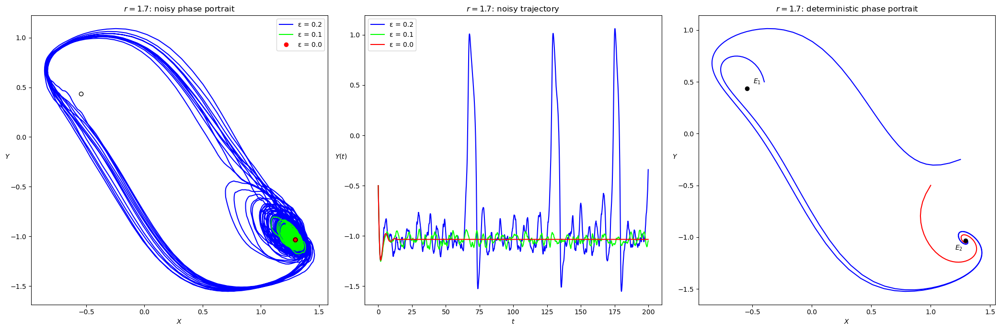

In [48]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 1.7

E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))

eps = 0.2
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=f'ε = {eps}')

eps = 0.1
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=f'ε = {eps}')

eps = 0.
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], 'o', color='red', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=f'ε = {eps}')
axs[2].plot(R[0,:], R[1,:], color='red', label=f'ε = {eps}')

# refine the first two graphs
axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle='none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle='none')
axs[0].set_xlabel(r'$X$'); axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$'); axs[1].set_ylabel(r'$Y(t)$', rotation=0)

# deterministc phase portrait
R2, time2 = system.simulateTraj((1.25, -0.25, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='blue', label=f'ε = {eps}')
R3, time3 = system.simulateTraj((-0.4, 0.5, 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[1,:], color='blue', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].set_xlabel(r'$X$'); axs[2].set_ylabel(r'$Y$', rotation=0)

axs[0].legend()
axs[1].legend()
axs[0].set_title(fr'$r={r}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}$: noisy trajectory')
axs[2].set_title(fr'$r={r}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

Second, we consider the behavior of the stochastic system in the monostability region $r_4 < r < r_5$, where the deterministic system has $E_1$ as its single attractor and no stable limit cycles. In the left and middle panels, for $r = 1.7$, we examine the system's behavior for two noise intensities. For weak noise, $\epsilon = 0.1$, SASIO is observed near $E_1$, while for $\epsilon = 0.2$, a complex regime with alternating SASIO and LASIO is evident. This phenomenon can be interpreted as a noise-induced excitation of LASIO in a parameter zone with a single equilibrium attractor. In other words, for $r = 1.7$, the deterministic system has $E_1$ as its single attractor, and for trajectories converging to $E_1$, two types of transient processes are observed. For small deviations of initial states (subthreshold zone), the trajectories immediately tend to $E_1$. For larger deviations (superthreshold zone), the trajectory first moves away from $E_1$ and exhibits a large-amplitude loop. In the stochastic system, the transformation from SASIO to LASIO can be explained by the transition of the system's solutions from the subthreshold zone to the superthreshold zone.

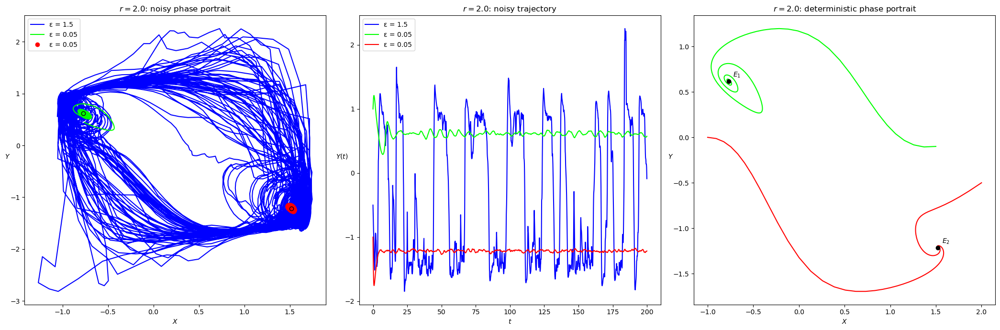

In [22]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 2.

E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))

eps = 1.5
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=f'ε = {eps}')

eps = 0.05
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, 1, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=f'ε = {eps}')

eps = 0.05
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((-1, -1, 0.01), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], 'o', color='red', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=f'ε = {eps}')

axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle = 'none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle = 'none')

# deterministic phase portrait
eps = 0
system = Saltzmann_Maasch(r=r, eps=0.)
R, time = system.simulateTraj((2, -0.5, 0.01), 1000, 10000)
axs[2].plot(R[0,:], R[1,:], color='red', label=f'ε = {eps}')
R2, time2 = system.simulateTraj((1.5, -0.1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='lime', label=f'ε = {eps}')
R3, time3 = system.simulateTraj((-1, -0., 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[1,:], color='red', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')

axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$')
axs[1].set_ylabel(r'$Y(t)$', rotation=0)
axs[2].set_xlabel(r'$X$')
axs[2].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()
axs[1].legend()

axs[0].set_title(fr'$r={r}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}$: noisy trajectory')
axs[2].set_title(fr'$r={r}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

Third, we consider the behavior of the stochastic system in the bistability zone $r > r_5$, where the deterministic system has two stable equilibria, $E_1$ and $E_2$. Equilibrium $E_1$ is associated with the cold climate state, whereas equilibrium $E_2$ corresponds to the warm state. In the left and middle panels, for $r = 1.9$, we illustrate the behavior of the stochastic system for two noise intensities. For $\epsilon = 0.05$, the solutions starting near $E_1$ and $E_2$ are shown in green and red, respectively. The trajectories are concentrated near their corresponding equilibria. With increasing noise, mutual transitions between the basins of attraction of these equilibria are revealed (see trajectories for $\epsilon = 0.5$). Thus, the climate system demonstrates a complex oscillatory regime with alternating SASIO and LASIO. For $r = 1.9$, the deterministic system has two stable equilibria, $E_1$ and $E_2$. Considering the behavior of the stochastic system's trajectories starting near $E_2$, weak noise localizes the trajectories, resulting in small-amplitude oscillations. As noise intensity increases, trajectories fall into the superthreshold zone, transition to the subthreshold zone of equilibrium $E_1$, and exhibit SASIO near $E_1$. With further noise increase, the system's solutions fall into the superthreshold zone of equilibrium $E_1$, generating large-amplitude oscillations around both $E_1$ and $E_2$.

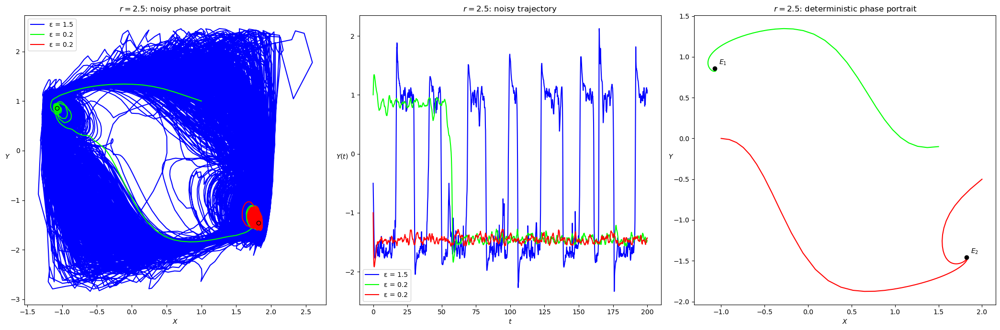

In [47]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 2.5

E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))

eps = 1.5
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 0.01), 10000, 100000)
axs[0].plot(R[0,:], R[1,:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=f'ε = {eps}')

eps = 0.2
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, 1, 0.01), 10000, 100000)
axs[0].plot(R[0,:], R[1,:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=f'ε = {eps}')

eps = 0.2
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((-1, -1, 0.01), 10000, 100000)
axs[0].plot(R[0,990:], R[1,990:], color='red', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=f'ε = {eps}')

axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle = 'none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle = 'none')

# deterministic phase portrait
eps = 0
system = Saltzmann_Maasch(r=r, eps=0.)
R, time = system.simulateTraj((2, -0.5, 0.01), 1000, 10000)
axs[2].plot(R[0,:], R[1,:], color='red', label=f'ε = {eps}')
R2, time2 = system.simulateTraj((1.5, -0.1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='lime', label=f'ε = {eps}')
R3, time3 = system.simulateTraj((-1, -0., 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[1,:], color='red', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')

axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$')
axs[1].set_ylabel(r'$Y(t)$', rotation=0)
axs[2].set_xlabel(r'$X$')
axs[2].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()
axs[1].legend()

axs[0].set_title(fr'$r={r}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}$: noisy trajectory')
axs[2].set_title(fr'$r={r}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

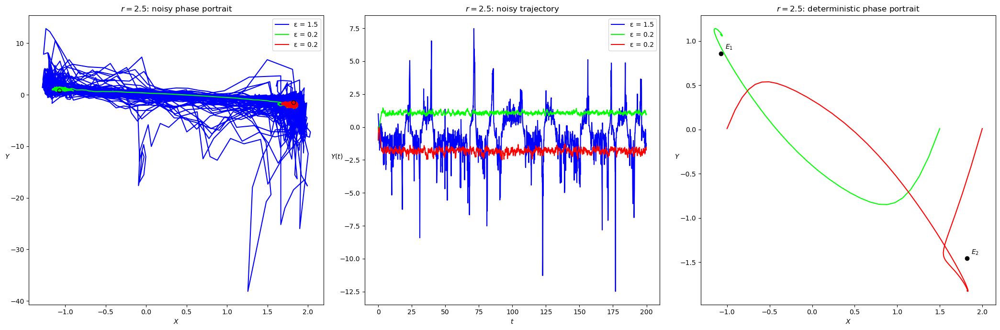

In [54]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 2.5

E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))

eps = 1.5
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, -0.5, 1), 1000, 10000)
axs[0].plot(R[0,50:], R[2,50:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[2,:2000], color='blue', label=f'ε = {eps}')

eps = 0.2
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((1, 1, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[2,50:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[2,:2000], color='lime', label=f'ε = {eps}')

eps = 0.2
system = Saltzmann_Maasch(r=r, eps=eps)
R, time = system.simulateTraj((-1, -1, -1), 1000, 10000)
axs[0].plot(R[0,50:], R[2,50:], color='red', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[2,:2000], color='red', label=f'ε = {eps}')

axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle = 'none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle = 'none')

# deterministic phase portrait
eps = 0
system = Saltzmann_Maasch(r=r, eps=0.)
R, time = system.simulateTraj((2, -0.5, 0.01), 1000, 10000)
axs[2].plot(R[0,:], R[2,:], color='red', label=f'ε = {eps}')
R2, time2 = system.simulateTraj((1.5, -0.1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[2,:], color='lime', label=f'ε = {eps}')
R3, time3 = system.simulateTraj((-1, -0., 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[2,:], color='red', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')

axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$')
axs[1].set_ylabel(r'$Y(t)$', rotation=0)
axs[2].set_xlabel(r'$X$')
axs[2].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()
axs[1].legend()

axs[0].set_title(fr'$r={r}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}$: noisy trajectory')
axs[2].set_title(fr'$r={r}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

Idential considerations as before.

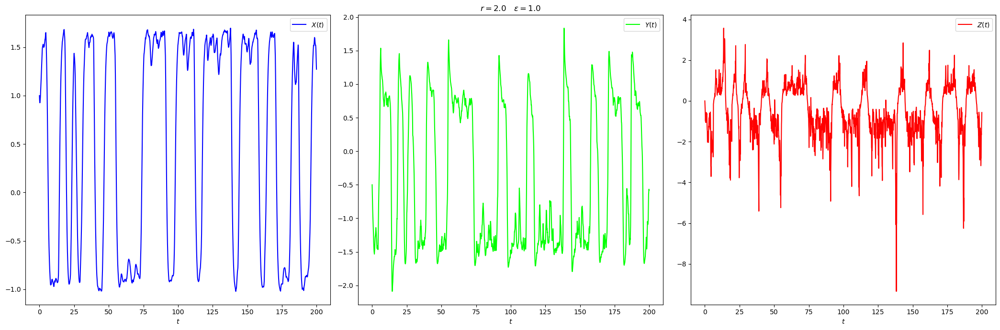

In [21]:
system = Saltzmann_Maasch(r=2., eps=1.)
R, time = system.simulateTraj((1, -0.5, 0.), 1000, 10000)

fig, axs = plt.subplots(1,3, figsize=(21,7))
axs[0].plot(time[:2000], R[0,:2000], label=r'$X(t)$', color = 'blue')
axs[0].set_xlabel(r'$t$')
axs[0].legend()
axs[1].plot(time[:2000], R[1,:2000], label=r'$Y(t)$', color = 'lime')
axs[1].set_xlabel(r'$t$')
axs[1].set_title(r'$r=2.0 \quad \epsilon=1.0$')
axs[1].legend()
axs[2].plot(time[:2000], R[2,:2000], label=r'$Z(t)$', color = 'red')
axs[2].set_xlabel(r'$t$')
axs[2].legend()

plt.tight_layout()
plt.show()

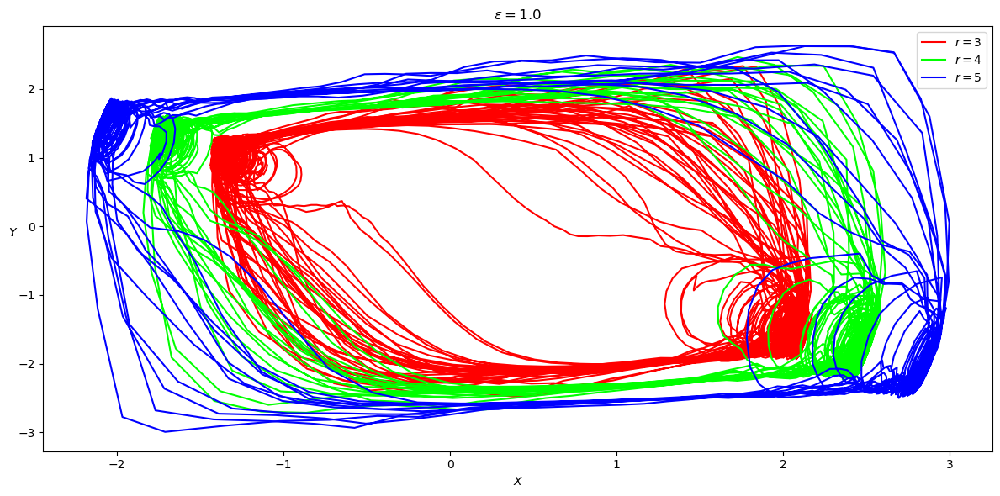

In [24]:
fig, ax = plt.subplots(figsize=(12,6))
#color = iter(plt.cm.tab10(np.linspace(0, 1, 10)))
color = iter(('red', 'lime', 'blue'))

for r in [3, 4, 5]:
    system = Saltzmann_Maasch(r=r, eps=1.)
    c = next(color)
    # simulate the system for 3 different initial conditions, 
    # studied before to carachterize the basins of attraction
    R1, _ = system.simulateTraj((1,1,0.01), 1000, 10000)
    ax.plot(R1[0, 5000:], R1[1, 5000:], color=c, label=fr'$r={r}$')
    R2, _ = system.simulateTraj((1,-0.5,0.01), 1000, 10000)
    ax.plot(R2[0, 5000:], R2[1, 5000:], color=c, label=fr'$r={r}$')

# make and adjust the legend
hand, labl = ax.get_legend_handles_labels()
handout=[]
lablout=[]
for h,l in zip(hand,labl):
   if l not in lablout:
        lablout.append(l)
        handout.append(h)
ax.legend(handout, lablout)
ax.set_xlabel(r'$X$')
ax.set_ylabel(r'$Y$', rotation=0)
ax.set_title(r'$\epsilon=1.0$')

plt.tight_layout()
plt.show()

Now we want to show the behavior of the noise-induced transformations in the stochastic system versus the noise intensity $\epsilon$, for different values of the parameter $r$ (here the $Y$ coordinates of random states are shown).

In particular, $Y$ coordinates of the stochastic system versus noise intensity $\epsilon$ for $r = 1.5$ (bistability: equilibrium $E_1$ and periodic limit cycle), $r = 1.7$ (monostability: equilibrium $E_1$ ), $r = 1.9$ (bistability: equilibria $E_1$ and $E_2$), $r=2.3$ (same as before). For $r=1.9, 2.3$ we can see a sharp transition from warm to cold climate state.

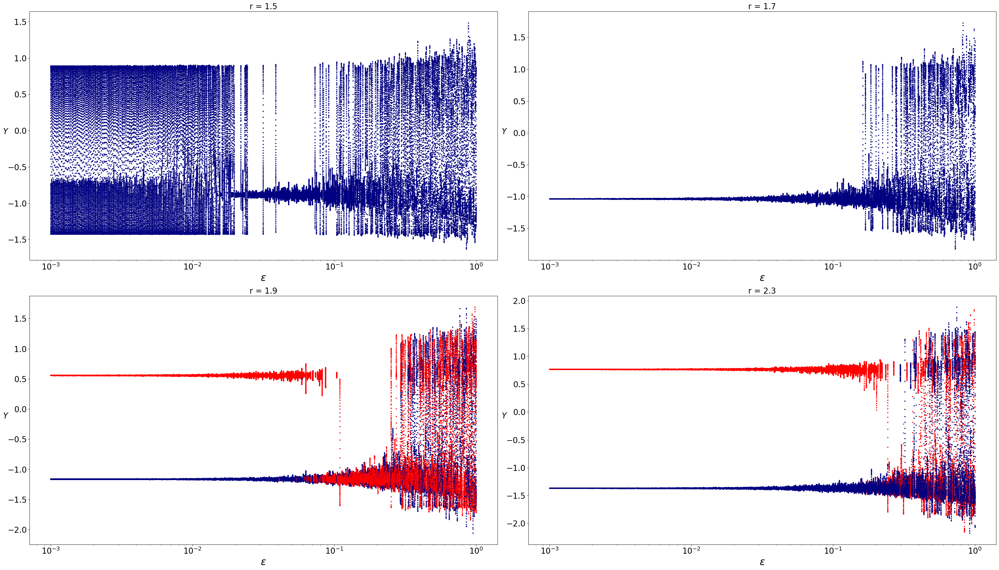

In [7]:
# vary the noise now
fig, axs = plt.subplots(2, 2, figsize=(35,20))
axs = axs.ravel()
r_vals = [1.5, 1.7, 1.9, 2.3]
eps_vals = np.geomspace(0.001, 1, 650)
for i, r in enumerate(r_vals):
    for eps in eps_vals:
        system = Saltzmann_Maasch(r=r, eps=eps)
        axs[i].set_xscale('log')
        # starting coordinates: first case
        R0 = (1, 1, 0.)
        R, time = system.simulateTraj(R0, 250, 2500)
        if r in [2.3]:
            axs[i].plot(eps, [R[1, 2400:]], ls='', ms=4, marker='.', color='red')
        else: axs[i].plot(eps, [R[1, 2400:]], ls='', ms=4, marker='.', color='navy')
        # starting coordinates: second case
        if r in [2.3]:
            R0 = (1., -0.5, 0.)
            R, time = system.simulateTraj(R0, 250, 2500)
            axs[i].plot(eps, [R[1, 2400:]], ls='', ms=4, marker='.', color='navy')
        # starting coordinates: third case
        if r in [1.9]:
            R0 = (-0.5, 0.5, 1.)
            R, time = system.simulateTraj(R0, 250, 2500)
            axs[i].plot(eps, [R[1, 2400:]], ls='', ms=4, marker='.', color='red')
        
        axs[i].set_xlabel(r'$\epsilon$', fontsize=25)
        axs[i].set_ylabel(r'$Y$', fontsize=20, rotation=0)
        axs[i].tick_params(axis='both', labelsize=20)
        axs[i].tick_params(axis='both', labelsize=20)
        axs[i].set_title(fr'r = {r}', fontsize=20)

plt.tight_layout()
plt.show()

In the bistability zone where $r > r_5$, an intriguing multiphase process of stochastic transformation is observed. If a random trajectory begins near $E_1$ (indicated in blue), increasing noise reveals only two phases: small amplitude stochastic oscillations (SASIO) near $E_1$ and large amplitude stochastic oscillations (LASIO) between $E_1$ and $E_2$. Conversely, if the random trajectory starts from $E_2$ (indicated in red), three phases are observed: SASIO near $E_2$, a transition to SASIO near $E_1$, and LASIO between $E_1$ and $E_2$. This characteristic of the climate model, which involves abrupt transitions due to sudden switching between different climate attractors, is also evident in climate records.

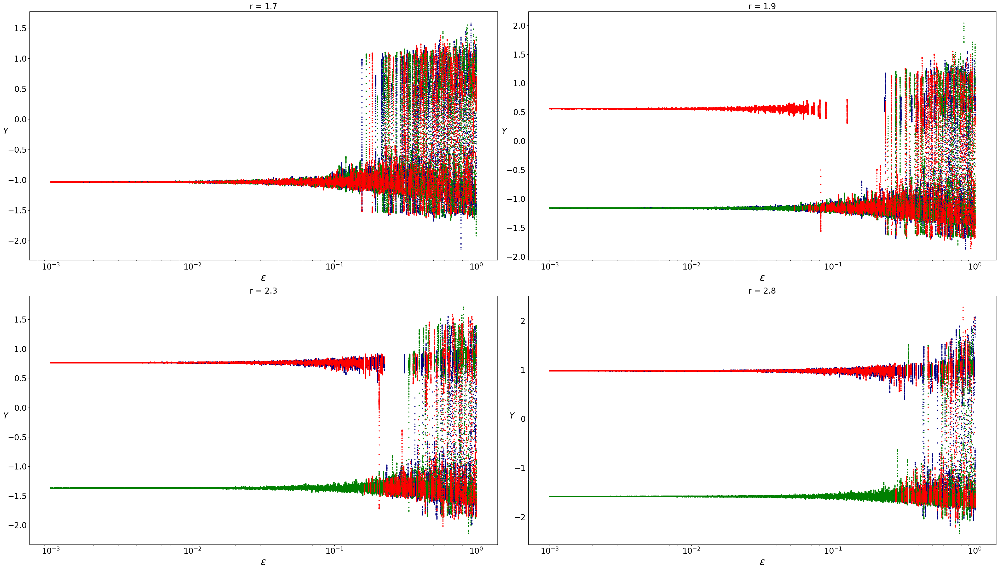

In [80]:
# vary the noise now
fig, axs = plt.subplots(2, 2, figsize=(35,20))
axs = axs.ravel()
r_vals = [1.7, 1.9, 2.3, 2.8]
eps_vals = np.geomspace(0.001, 1, 500)
for i, r in enumerate(r_vals):
    for eps in eps_vals:
        system = Saltzmann_Maasch(r=r, eps=eps)
        axs[i].set_xscale('log')
        # starting coordinates: first case
        R0 = (1, 1, 0.)
        R, time = system.simulateTraj(R0, 200, 2000)
        axs[i].plot(eps, [R[1, 1900:]], ls='', ms=4, marker='.', color='navy')
        # starting coordinates: second case
        R0 = (1., -0.5, 0.)
        R, time = system.simulateTraj(R0, 200, 2000)
        axs[i].plot(eps, [R[1, 1900:]], ls='', ms=4, marker='.', color='green')
        # starting coordinates: third case
        R0 = (-0.5, 0.5, 1.)
        R, time = system.simulateTraj(R0, 200, 2000)
        axs[i].plot(eps, [R[1, 1900:]], ls='', ms=4, marker='.', color='red')

        axs[i].set_xlabel(r'$\epsilon$', fontsize=25)
        axs[i].set_ylabel(r'$Y$', fontsize=20, rotation=0)
        axs[i].tick_params(axis='both', labelsize=20)
        axs[i].tick_params(axis='both', labelsize=20)
        axs[i].set_title(fr'r = {r}', fontsize=20)

plt.tight_layout()
plt.show()

## Improving the model and further analysis

In the following part of the notebook, an expanded version of the model is presented an deeper analyzed. Improving a model often involves refining the system's dynamics or incorporating additional terms that better capture the underlying phenomena. In particular, the model studied in the paper and analyzed so far, can be described by the following system of differential equations (considering also the stochastic term):
$$
\begin{cases}
    \dot{X} = -X -Y -vZ \\ 
    \dot{Y} = -pZ + rY -sY^2 -Y^3 \\
    \dot{Z} = -q(X+Z) + \epsilon Z \xi(t)
\end{cases}
$$
where $\xi(t)$ is a multiplicative white noise. We can consider a few potential improvements for the Saltzman-Maasch model.

##### Generalize the deterministic part of the model, adding nonlinearities and coupling terms
Introducing coupling terms between the equations can help model interactions between the variables more realistically, and non-linear terms can sometimes better capture the dynamics of complex systems. To take this into account, in the further analysis of this work, I propose the following model, expliciting the multiplicative linear combination $(\beta_1 - \beta_2 Y - \beta_3 Y^2)$:
$$
\begin{cases}
    \dot{X} = - \alpha_1 Y -\alpha_2 X -\alpha_3 Z \\
    \dot{Y} = (\beta_1 - \beta_2 Y - \beta_3 Y^2)Y - (\beta_4 - \beta_5 Y -\beta_6 Y^2)Z \\
    \dot{Z} = -\gamma_2 X -\gamma_3 Z + \epsilon Z \xi(t)
\end{cases}
$$
Rearranging and renaming the parameters (in order to reduce the dimension of the parameters' space) we get the form:
$$
\begin{cases}
    \alpha_1=\alpha_2=a, \quad \alpha_3 = v \\
    \beta_1=r, \quad \beta_2=s, \quad \beta_3=1 \\
    \beta_4=p, \quad \beta_5=b, \quad \beta_6 = c\\
    \gamma_1=\gamma_2=q
\end{cases}
\implies
\begin{cases}
    \dot{X} = -a(X+Y) -v Z \\ 
    \dot{Y} = -pZ + rY -sY^2 - Y^3 +bYZ +cZY^2 \\
    \dot{Z} = -q(X+Z) + \epsilon Z \xi(t)
\end{cases}
$$
It is easy to see that imposing $a=1, b=0, c=0$ we obtain exactly the model of the paper analyzed previously. To sum up, the main difference with respect to the previous model is the introduction of the coupling term term $YZ$ and the non-linear coupling term $Y^2Z$ in the second equation of the system.

##### Generalize the multiplicative stochastic term
The multiplicative noise term in the third equation can be refined to better represent the stochastic nature of the system. Instead of a simple multiplicative white noise, we can use a more sophisticated noise model, such as an Orstein-Uhlenbeck (OU) process $\eta(t)$, and/or incorporating a different dependency on the variables. Since the deterministic part of the third equation of the system is of the form $\dot{Z} = f(X,Z) = -q(Z+X)$, we can generalize the model as:
$$
\begin{aligned}
    &\dot{X} = -a(X+Y) -vZ \\ 
    &\dot{Y} = -pZ + rY -sY^2 -Y^3 +bYZ +cZY^2\\
    &\dot{Z} = -q(X+Z) + \epsilon Z (1 + dX) \eta(t)
\end{aligned}
$$
where $d$ is a constant determining how the noise term depends on $X$, and $\eta(t)$ is a noise process, that can be a simple white gaussian noise or an Ornstein–Uhlenbeck process.

##### Including external stochastic forcing terms
In some contexts, an external stochastic term might be relevant, especially if the system is influenced by external factors:
$$
\begin{aligned}
    &\dot{X} = -a(X+Y) -vZ + \omega_X \xi(t) \\ 
    &\dot{Y} = -pZ + rY -sY^2 -Y^3 +bYZ +cZY^2 + \omega_Y \xi(t)\\
    &\dot{Z} = -q(X+Z) + \epsilon Z (1 + dX) \eta(t)
\end{aligned}
$$
where $\xi(t)$ is an additive white noise term.

##### Final Improved Model
Combining togethere these factors, we could propose the following improved model:
$$
\begin{aligned}
    &\dot{X} = -a(X+Y) -vZ + \omega_X \xi(t) \\ 
    &\dot{Y} = -pZ + rY -sY^2 -Y^3 +bYZ +cZY^2 + \omega_Y \xi(t)\\
    &\dot{Z} = -q(X+Z) + \epsilon Z (1 + dX) \eta(t)
\end{aligned}
$$
where:
- $a, b, c, d \geq 0$
- $\xi(t)$ is a white noise term, assuming the role of an external stochastic term
- $\eta(t)$ can be a white noise term, or an Ornstein–Uhlenbeck process, assuming the role of a multiplicative noise term

In [68]:
class Saltzmann_Maasch_advanced(object):
    '''
    The nondimensional parameters p, q, r, and s are each combinations of various physical parameters, 
    and they are all positive. Here, p and r represent the effective rate constants for how the
    CO2 concentration (y) changes as the NADW (z) and CO2 concentration change, respectively. 
    Next, q is the effective ratio of the characteristic time scales for the total global ice mass (x) and the
    volume of NADW; for physical reasons, q > 1. Then, the parameter s is a symmetry parameter. 
    With s = 0, the model possesses a reflection symmetry; if (x, y, z) is a solution, then so
    is (-x, -y, -z). In this special case, glaciation and deglaciation occur at the same rates. 
    Physically, however, it is observed that deglaciation occurs at a faster rate than glaciation, and s > 0
    guarantees this asymmetry. All of these nondimensional parameters incorporate several dimensional 
    rate constants as well as dimensional parameters and quantities related to the global mean
    sea surface temperature and the mean volume of permanent sea ice. Also, the three variables 
    are properly correlated: as the concentration of the atmospheric CO2 (a greenhouse gas) increases, 
    the climate gets warmer, and the total ice mass decreases (deglaciation); as the
    volume of NADW increases, the strength of the North Atlantic over-turning circulation increases, 
    more atmospheric CO2 is absorbed by the ocean and, consequently, the atmospheric CO2 concentration decreases.
    '''

    # class constructor
    def __init__(self,  r:float, 
                        a:float=1., 
                        v:float=0.2, 
                        p:float=1., 
                        s:float=0.6, 
                        b:float=0.1,
                        c:float=0.1,
                        q:float=2.5, 
                        eps:float=0.,
                        d:float = 0.,
                        noise_type = 'W',
                        omega_x:float=0.,
                        omega_y:float=0.)->None:

        self.r = r
        self.a = a
        self.v = v
        self.p = p
        self.s = s
        self.b = b
        self.c = c
        self.q = q
        self.eps = eps
        self.d = d
        self.noise_type = noise_type
        self.omega_x = omega_x
        self.omega_y = omega_y
        
        # setup random generator
        self.rng = Generator(PCG64())
        # check if the inserted parameters are valid:
        if(r<0 or v<0 or p<0 or s<0 or q<1):
            raise RuntimeError("Invalid parameters: it must be r>0, v>0, p>0, s>0, q>1")
        return


    def __checkInputs(self, T:float=10., N:int=10)->None:
        '''
        Given the inputs for a trajectory simulation, this method will
        check if they are correct
        '''
        # T check:
        if T<0:
            raise RuntimeError("Time interval must have a positive lenght")
        # N check:
        if N<=1:
            raise RuntimeError("The simulation must have at least two steps")
        return
    

    def __ODEs(self, r:tuple[float], t:float=None):
        X, Y, Z = r
        return np.array([   -self.a*(X + Y) -self.v*Z,                                                  # ... dx/dt
                            -self.p*Z + self.r*Y -self.s*(Y**2) -Y**3 +self.b*Z*Y +self.c*Z*(Y**2),     # ... dy/dt
                            -self.q*(X + Z)])                                                           # ... dz/dt

    
    def deterministic_equilibria(self):
        # Calculate the common expressions to avoid redundant computations
        term1 = self.b * self.a / (self.a - self.v)
        term2 = self.c * self.a / (self.a - self.v) - 1
        term3 = self.r - self.p * self.a / (self.a - self.v)
        discriminant = (term1-self.s)**2 - 4 * term2 * term3
        denominator = 2 * term2

        if discriminant < 0:
            raise ValueError("The discriminant is negative, so there are no real solutions.")

        sqrt_discriminant = np.sqrt(discriminant)
        # Calculate the two possible values of Y
        Y1 = (self.s - term1 - sqrt_discriminant) / denominator
        Y2 = (self.s - term1 + sqrt_discriminant) / denominator
        E1 = (self.a*Y1/(self.v-self.a), Y1) 
        E2 = (self.a*Y2/(self.v-self.a), Y2)
        return E1, E2


    def __RK4(self, r_n:tuple[float], t_n:float, dt:float)->float: 
        '''
        Given a point in the trajectory, the time instant and the step lenght,
        this method will compute the variation for y using the RK4 for the 
        deterministic part of the PLS
        '''
        # Perform the check of the inputs. For N we hard code a good 
        self.__checkInputs(T = t_n)
        if dt<=0:
            raise RuntimeError("Given dt is negative or 0")

        k_1 = self.__ODEs(r_n)
        k_2 = self.__ODEs(r_n + dt*k_1/2)
        k_3 = self.__ODEs(r_n + dt*k_2/2)
        k_4 = self.__ODEs(r_n + dt*k_3)
        return dt*(k_1 + 2*k_2 + 2*k_3 + k_4)/6
        
    
    def simulateTraj(self, R0:tuple[float], T:float, N:int):
        '''
        Given the initial population value x0, the considered interval lenght T
        and the number of step in the computation N, this method will return a
        trajectory for the PLS.
        '''
        self.__checkInputs(T,N)
        if T==0:
            return np.array(R0)

        dt = T/N
        R = np.zeros((3,N+1), dtype=float)
        R[:,0] = R0
        time = np.zeros(N+1, dtype=float)
        time[0] = 0.0
        eta = np.zeros(N+1, dtype=float)

        for i in range(1,N+1):
            time[i] = i*dt
            # deterministic part through RK method
            dR =  self.__RK4(R[:, i-1], time[i-1], dt)
            # additive white noise terms in the first and second equations
            dR[0] += self.omega_x*self.rng.normal()*np.sqrt(dt)
            dR[1] += self.omega_y*self.rng.normal()*np.sqrt(dt)
            # multiplicative noise term in the first equation:
            # gaussian white noise
            #dR[2] += self.eps*R[2, i-1]*(1-self.d*R[0, i-1])*self.rng.normal()*np.sqrt(dt)
            # Ornstein-Uhlenbeck stochastic process
            eta[i] = eta[i-1] - 1.0*eta[i-1]*dt + 1.0*self.rng.normal()*np.sqrt(dt)
            dR[2] += self.eps*R[2, i-1]*(1-self.d*R[0, i-1])*eta[i-1]
            R[:, i] = R[:, i-1] + dR

        return R, time

Following a procedure similar to the previous model, it is easy to deduce that, in addition to the equilibrium $E_0=(0,0,0)$, the new model presents equilibrium points corresponding to the values:
$$
Y_{1, 2} = \frac{s-\frac{ba}{a-v} \pm \sqrt{\left(\frac{ba}{a-v}-s\right)^2-4\left(\frac{ca}{a-v}-1\right)\left(r-\frac{pa}{a-v}\right)}} {2\left(\frac{ca}{a-v}-1\right)}
$$


which leads to the non-trivial equilibrium points expression:
$$
E_{1,2} = \left(-\frac{aY_{1,2}}{a-v}, \ Y_{1,2} \ , \ \frac{aY_{1,2}}{a-v}\right) \ .
$$

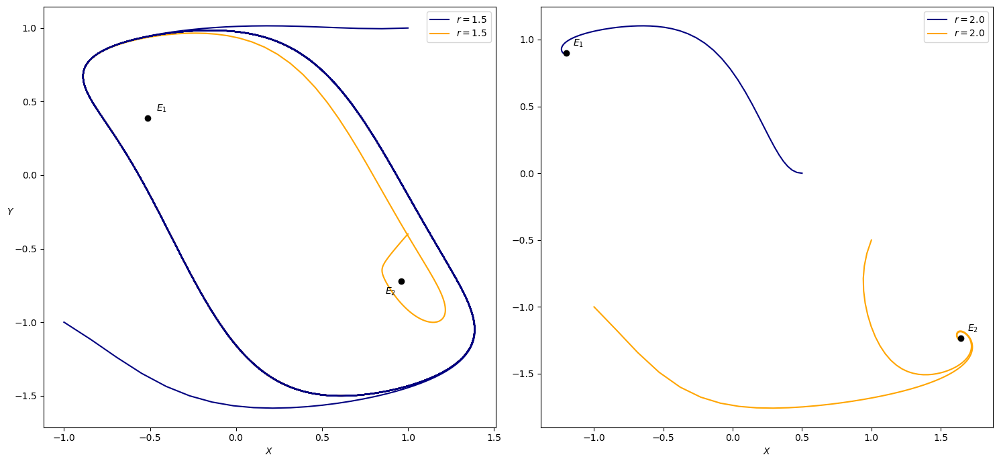

In [64]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r
r = 1.5
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d = 0.2, eps=0., omega_x=0., omega_y=0.)
# simulate the system for the same value of r, three times
# for three different initial conditions
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.4, 0.01), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# plot the resulting trajectories, differentiating the color
# in function of the equilibrium convergence
axs[0].plot(R1[0], R1[1], color='navy'  , label = fr'$r={r}$')
axs[0].plot(R2[0], R2[1], color='orange', label = fr'$r={r}$')
axs[0].plot(R3[0], R3[1], color='navy')
# display the equilibrium points using the formula above
E1, E2 = system.deterministic_equilibria()
axs[0].plot(E1[0], E1[1], 'o', color='black')
axs[0].plot(E2[0], E2[1], 'o', color='black')
axs[0].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[0].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of the parameter r
r = 2.0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d = 0.2, eps=0., omega_x=0., omega_y=0.)
R1, time1 = system.simulateTraj((0.5, 0, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# simulate the system three times again, using the same 
# initial points as in the case before
axs[1].plot(R1[0], R1[1], color='navy'  , label = fr'$r={r}$')
axs[1].plot(R2[0], R2[1], color='orange', label = fr'$r={r}$')
axs[1].plot(R3[0], R3[1], color='orange')
# display the equilibrium points
E1, E2 = system.deterministic_equilibria()
axs[1].plot(E1[0], E1[1], 'o', color='black')
axs[1].plot(E2[0], E2[1], 'o', color='black')
axs[1].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[1].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

Study how the attractors change varying the parameters $b$ and $c$.

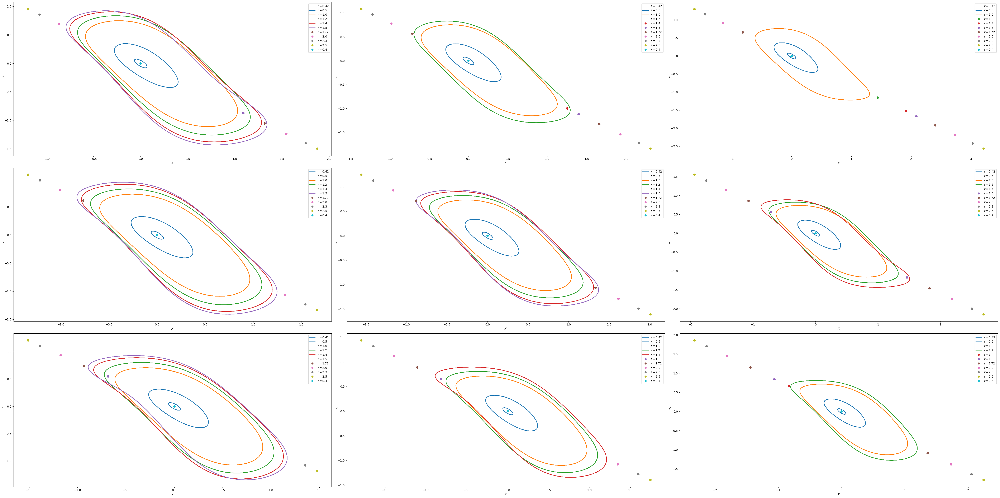

In [98]:
fig, axs = plt.subplots(3, 3, figsize=(3*16,3*8))

for i, b in enumerate([0.1, 0.3, 0.5]):
    for j, c in enumerate([0.1, 0.3, 0.5]):

        colors = iter(plt.cm.tab10(np.linspace(0, 1, 12)))
        # define a set of values of the parameter r
        for r in [0.42, 0.5, 1., 1.2, 1.4, 1.5, 1.72, 2., 2.3, 2.5]:
            system = Saltzmann_Maasch_advanced(r=r, a=1.0, b=b, c=c, d=0.2, eps=0., omega_x=0., omega_y=0.)
            color = next(colors)
            # simulate the system for 3 different initial conditions, 
            # already examined before to characterize the basins of attraction
            R1, _ = system.simulateTraj((1,1,0.01), 1000, 10000)
            # if the system has reached a single attractive equilibrium point, 
            # display that point
            if (abs(R1[1,-1]-R1[1,-10])<1e-8):
                axs[i,j].plot(R1[0, 9500:], R1[1, 9500:],'o', color=color, label=fr'$r={r}$')
            # otherwise the system is following a certain closed trajectory, 
            # called 'attractor' trajectory, which is then displayed
            else:
                axs[i,j].plot(R1[0, 9500:], R1[1, 9500:], color=color, label=fr'$r={r}$')
            # simulate the system with a second initial point
            R2, _ = system.simulateTraj((1,-0.5,0.01), 1000, 10000)
            if (abs(R2[1,-1]-R2[1,-10])<1e-8):
                axs[i,j].plot(R2[0, 9500:], R2[1, 9500:],'o', color=color, label=fr'$r={r}$')
            else:
                axs[i,j].plot(R2[0, 9500:], R2[1, 9500:], color=color, label=fr'$r={r}$')
            # simulate the system with a third initial point
            R3, _ = system.simulateTraj((-0.5,0.5,1.), 1000, 10000)
            if (abs(R3[1,-1]-R3[1,-10])<1e-8):
                axs[i,j].plot(R3[0, 9500:], R3[1, 9500:],'o', color=color, label=fr'$r={r}$')
            else:
                axs[i,j].plot(R3[0, 9500:], R3[1, 9500:], color=color, label=fr'$r={r}$')
    
        # simulate the system also for the value r=0.4, as done in the previous plots.
        # In this case we know that the system has only the trivial equilibrium point E_0, 
        # which is reached in a finite time by the system
        for r in [0.4]:
            system = Saltzmann_Maasch(r=r)
            R1, _ = system.simulateTraj((1, 1, 0), 1000, 10000)
            color = next(colors)
            axs[i,j].plot(R1[0, 9500:], R1[1, 9500:], 'o', color=color, label=fr'$r={r}$')

        # adjust the legend of labels
        hand, labl = axs[i,j].get_legend_handles_labels()
        handout=[]
        lablout=[]
        for h,l in zip(hand,labl):
           if l not in lablout:
                lablout.append(l)
                handout.append(h)
        axs[i,j].legend(handout, lablout)

        axs[i,j].set_xlabel(r'$X$')
        axs[i,j].set_ylabel(r'$Y$', rotation=0)

plt.tight_layout()
plt.show()

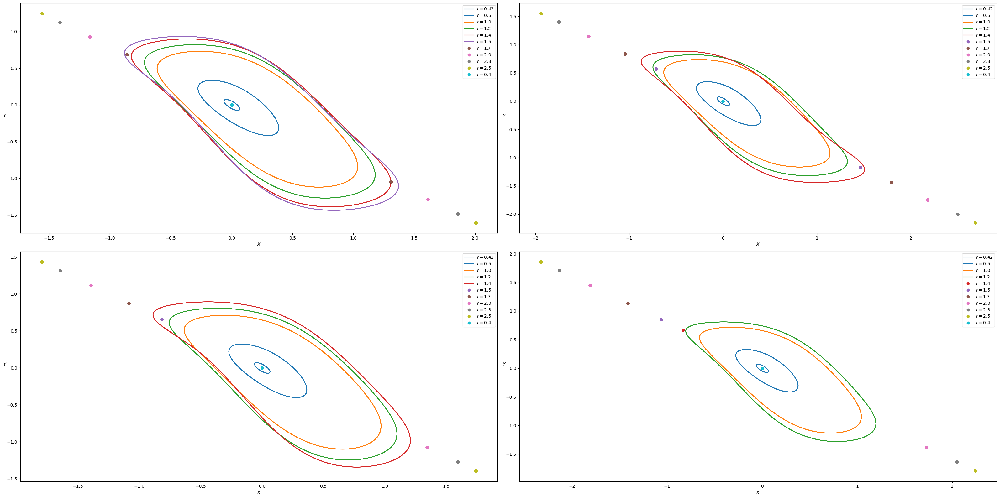

In [248]:
fig, axs = plt.subplots(2, 2, figsize=(2*16,2*8))

for i, b in enumerate([0.3, 0.5]):
    for j, c in enumerate([0.3, 0.5]):

        colors = iter(plt.cm.tab10(np.linspace(0, 1, 12)))
        # define a set of values of the parameter r
        for r in [0.42, 0.5, 1., 1.2, 1.4, 1.5, 1.7, 2., 2.3, 2.5]:
            system = Saltzmann_Maasch_advanced(r=r, a=1.0, b=b, c=c, d=0.2, eps=0., omega_x=0., omega_y=0.)
            color = next(colors)
            # simulate the system for 3 different initial conditions, 
            # already examined before to characterize the basins of attraction
            R1, _ = system.simulateTraj((1,1,0.01), 1000, 10000)
            # if the system has reached a single attractive equilibrium point, 
            # display that point
            if (abs(R1[1,-1]-R1[1,-10])<1e-8):
                axs[i,j].plot(R1[0, 9500:], R1[1, 9500:],'o', color=color, label=fr'$r={r}$')
            # otherwise the system is following a certain closed trajectory, 
            # called 'attractor' trajectory, which is then displayed
            else:
                axs[i,j].plot(R1[0, 9500:], R1[1, 9500:], color=color, label=fr'$r={r}$')
            # simulate the system with a second initial point
            R2, _ = system.simulateTraj((1,-0.5,0.01), 1000, 10000)
            if (abs(R2[1,-1]-R2[1,-10])<1e-8):
                axs[i,j].plot(R2[0, 9500:], R2[1, 9500:],'o', color=color, label=fr'$r={r}$')
            else:
                axs[i,j].plot(R2[0, 9500:], R2[1, 9500:], color=color, label=fr'$r={r}$')
            # simulate the system with a third initial point
            R3, _ = system.simulateTraj((-0.5,0.5,1.), 1000, 10000)
            if (abs(R3[1,-1]-R3[1,-10])<1e-8):
                axs[i,j].plot(R3[0, 9500:], R3[1, 9500:],'o', color=color, label=fr'$r={r}$')
            else:
                axs[i,j].plot(R3[0, 9500:], R3[1, 9500:], color=color, label=fr'$r={r}$')
    
        # simulate the system also for the value r=0.4, as done in the previous plots.
        # In this case we know that the system has only the trivial equilibrium point E_0, 
        # which is reached in a finite time by the system
        for r in [0.4]:
            system = Saltzmann_Maasch(r=r)
            R1, _ = system.simulateTraj((1, 1, 0), 1000, 10000)
            color = next(colors)
            axs[i,j].plot(R1[0, 9500:], R1[1, 9500:], 'o', color=color, label=fr'$r={r}$')

        # adjust the legend of labels
        hand, labl = axs[i,j].get_legend_handles_labels()
        handout=[]
        lablout=[]
        for h,l in zip(hand,labl):
           if l not in lablout:
                lablout.append(l)
                handout.append(h)
        axs[i,j].legend(handout, lablout)

        axs[i,j].set_xlabel(r'$X$')
        axs[i,j].set_ylabel(r'$Y$', rotation=0)

plt.tight_layout()
plt.show()

Now we want to study how the attractors change varying the parameter $a$:

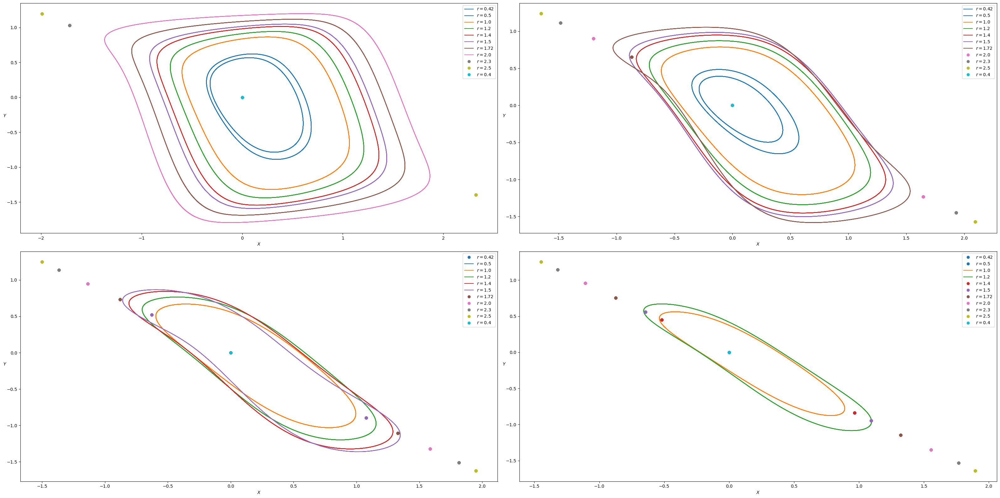

In [97]:
fig, axs = plt.subplots(2, 2, figsize=(2*16,2*8))
axs = axs.ravel()

for i, a in enumerate([0.5, 0.8, 1.2, 1.5]):
        colors = iter(plt.cm.tab10(np.linspace(0, 1, 12)))
        # define a set of values of the parameter r
        for r in [0.42, 0.5, 1., 1.2, 1.4, 1.5, 1.72, 2., 2.3, 2.5]:
            system = Saltzmann_Maasch_advanced(r=r, a=a, b=0.3, c=0.3, d=0.2, eps=0., omega_x=0., omega_y=0.)
            color = next(colors)
            # simulate the system for 3 different initial conditions, 
            # already examined before to characterize the basins of attraction
            R1, _ = system.simulateTraj((1,1,0.01), 1000, 10000)
            # if the system has reached a single attractive equilibrium point, 
            # display that point
            if (abs(R1[1,-1]-R1[1,-10])<1e-8):
                axs[i].plot(R1[0, 9500:], R1[1, 9500:],'o', color=color, label=fr'$r={r}$')
            # otherwise the system is following a certain closed trajectory, 
            # called 'attractor' trajectory, which is then displayed
            else:
                axs[i].plot(R1[0, 9500:], R1[1, 9500:], color=color, label=fr'$r={r}$')
            # simulate the system with a second initial point
            R2, _ = system.simulateTraj((1,-0.5,0.01), 1000, 10000)
            if (abs(R2[1,-1]-R2[1,-10])<1e-8):
                axs[i].plot(R2[0, 9500:], R2[1, 9500:],'o', color=color, label=fr'$r={r}$')
            else:
                axs[i].plot(R2[0, 9500:], R2[1, 9500:], color=color, label=fr'$r={r}$')
            # simulate the system with a third initial point
            R3, _ = system.simulateTraj((-0.5,0.5,1.), 1000, 10000)
            if (abs(R3[1,-1]-R3[1,-10])<1e-8):
                axs[i].plot(R3[0, 9500:], R3[1, 9500:],'o', color=color, label=fr'$r={r}$')
            else:
                axs[i].plot(R3[0, 9500:], R3[1, 9500:], color=color, label=fr'$r={r}$')
    
        # simulate the system also for the value r=0.4, as done in the previous plots.
        # In this case we know that the system has only the trivial equilibrium point E_0, 
        # which is reached in a finite time by the system
        for r in [0.4]:
            system = Saltzmann_Maasch(r=r)
            R1, _ = system.simulateTraj((1, 1, 0), 1000, 10000)
            color = next(colors)
            axs[i].plot(R1[0, 9500:], R1[1, 9500:], 'o', color=color, label=fr'$r={r}$')

        # adjust the legend of labels
        hand, labl = axs[i].get_legend_handles_labels()
        handout=[]
        lablout=[]
        for h,l in zip(hand,labl):
           if l not in lablout:
                lablout.append(l)
                handout.append(h)
        axs[i].legend(handout, lablout)

        axs[i].set_xlabel(r'$X$')
        axs[i].set_ylabel(r'$Y$', rotation=0)

plt.tight_layout()
plt.show()

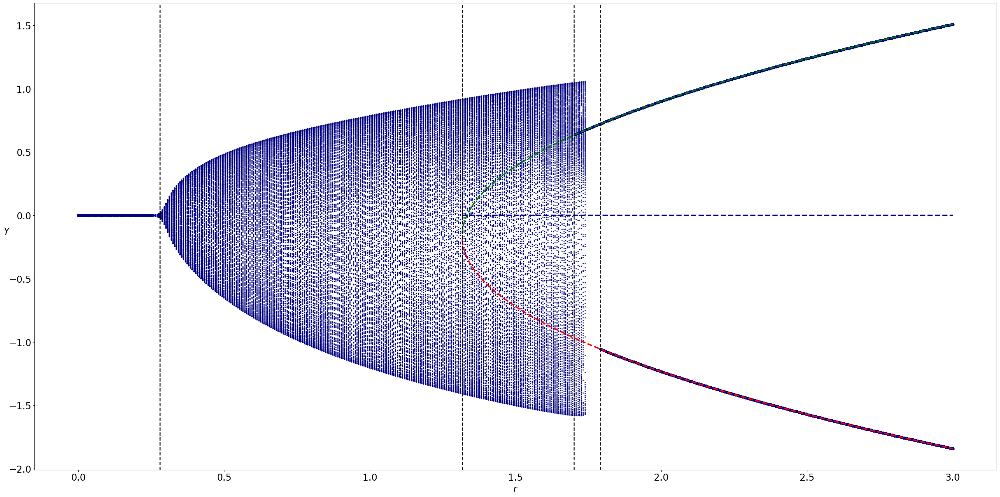

In [99]:
# create the bifurcation diagram
fig = plt.figure(figsize=(30,15))
r_vals = np.linspace(0., 3., 500)
for r in r_vals:
    system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=0., omega_x=0., omega_y=0.)

    R0 = (1, 1, 0.01)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-3])<1e-5):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

    R0 = (1., -0.5, 0.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-4):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

    R0 = (-0.5, 0.5, 1.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-4):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

x = np.linspace(1.317, 3, 1000)
term1 = 0.3 * 0.8 / (0.8 - 0.2)
term2 = 0.3 * 0.8 / (0.8 - 0.2) - 1
term3 = x - 1.0 * 0.8 / (0.8 - 0.2)
discriminant = (term1-0.6)**2 - 4 * term2 * term3
denominator = 2 * term2
if discriminant.all() < 0:
    raise ValueError("The discriminant is negative, so there are no real solutions.")
sqrt_discriminant = np.sqrt(discriminant)
# Calculate the two possible values of Y
Y1 = (0.6 - term1 - sqrt_discriminant) / denominator
Y2 = (0.6 - term1 + sqrt_discriminant) / denominator

plt.plot(x, Y1, ls='--', color='green',   lw=3)
plt.plot(x, Y2, ls='--', color='red', lw=3)
plt.plot(x, [0]*len(x),           ls='--', color='navy',  lw=3)

plt.axvline(x=0.28, ls='--', color='black', lw=2)
plt.axvline(x=1.317, ls='--', color='black', lw=2)
plt.axvline(x=1.7, ls='--', color='black', lw=2)
plt.axvline(x=1.79, ls='--', color='black', lw=2)

plt.xlabel(r'$r$', fontsize=20)
plt.ylabel(r'$Y$', fontsize=20, rotation=0)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()

The most interesting step is now to analyze the new stochastic model: start with the multiplicative noise term $\eta(t)$ as white gaussian noise:

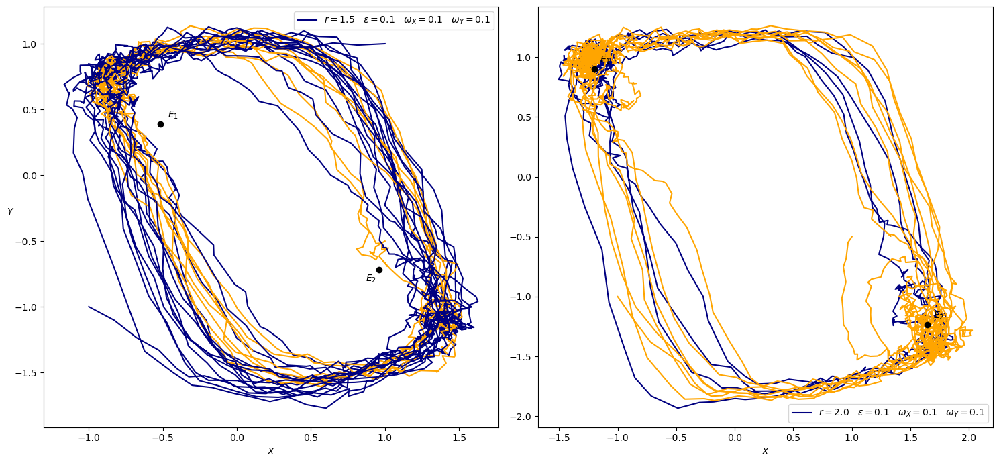

In [65]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r and the noise term eps
r = 1.5 ; eps=0.1 ; omega_x = 0.1 ; omega_y = 0.1
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
# simulate the system for the same value of r, three times
# for three different initial conditions
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0.01), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# plot the resulting trajectories, differentiating the color
# in function of the equilibrium convergence
axs[0].plot(R1[0], R1[1], color='navy'  , label = fr'$r={r} \quad \epsilon={eps} \quad \omega_X = {omega_x} \quad \omega_Y={omega_y}$')
axs[0].plot(R2[0], R2[1], color='orange')
axs[0].plot(R3[0], R3[1], color='navy')
# display the equilibrium points using the formula above
E1, E2 = system.deterministic_equilibria()
axs[0].plot(E1[0], E1[1], 'o', color='black')
axs[0].plot(E2[0], E2[1], 'o', color='black')
axs[0].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[0].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of the parameter r
r = 2.0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# simulate the system three times again, using the same 
# initial points as in the case before
axs[1].plot(R1[0], R1[1], color='navy', label = fr'$r={r} \quad \epsilon={eps} \quad \omega_X = {omega_x} \quad \omega_Y={omega_y}$')
axs[1].plot(R2[0], R2[1], color='orange')
axs[1].plot(R3[0], R3[1], color='orange')
# display the equilibrium points
E1, E2 = system.deterministic_equilibria()
axs[1].plot(E1[0], E1[1], 'o', color='black')
axs[1].plot(E2[0], E2[1], 'o', color='black')
axs[1].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[1].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

This result makes perfectly sense: in fact we can notice a more fragmented behavior near the deterministic equilibrium points, having a large enough level of additive white noise. This makes perfectly sense, since near the equilibrium points we have the determinist function $f(X, Y, Z)\approx 0$, and then the effect of the additive noise $\xi(t)$ becomes more relevant. 

Now we can generalize using a more sophisticated noise model as the cited Ornstein-Uhlenbeck stochastic process:

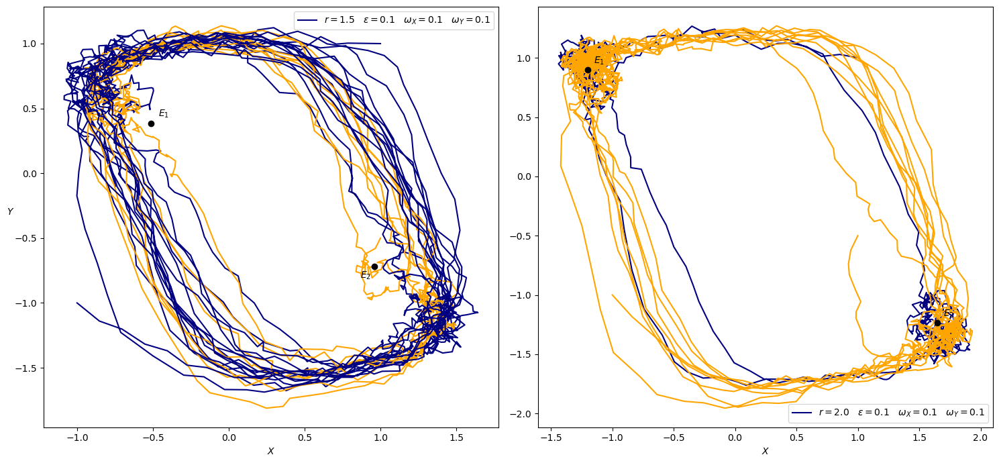

In [66]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r and the noise term eps
r = 1.5 ; eps=0.1 ; omega_x = 0.1 ; omega_y = 0.1
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
# simulate the system for the same value of r, three times
# for three different initial conditions
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0.01), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# plot the resulting trajectories, differentiating the color
# in function of the equilibrium convergence
axs[0].plot(R1[0], R1[1], color='navy'  , label = fr'$r={r} \quad \epsilon={eps} \quad \omega_X = {omega_x} \quad \omega_Y={omega_y}$')
axs[0].plot(R2[0], R2[1], color='orange')
axs[0].plot(R3[0], R3[1], color='navy')
# display the equilibrium points using the formula above
E1, E2 = system.deterministic_equilibria()
axs[0].plot(E1[0], E1[1], 'o', color='black')
axs[0].plot(E2[0], E2[1], 'o', color='black')
axs[0].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[0].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of the parameter r
r = 2.0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# simulate the system three times again, using the same 
# initial points as in the case before
axs[1].plot(R1[0], R1[1], color='navy', label = fr'$r={r} \quad \epsilon={eps} \quad \omega_X = {omega_x} \quad \omega_Y={omega_y}$')
axs[1].plot(R2[0], R2[1], color='orange')
axs[1].plot(R3[0], R3[1], color='orange')
# display the equilibrium points
E1, E2 = system.deterministic_equilibria()
axs[1].plot(E1[0], E1[1], 'o', color='black')
axs[1].plot(E2[0], E2[1], 'o', color='black')
axs[1].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[1].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

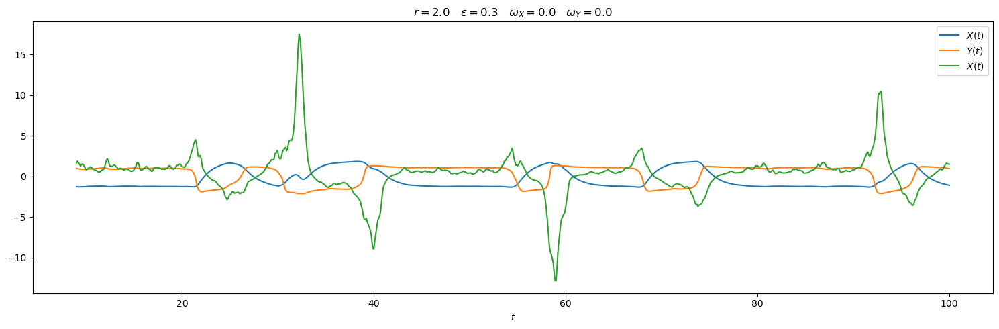

In [78]:
# instantiate the class for the system with a value r = 2.0, eps=0.3
r = 2.0 ; eps=0.3 ; omega_x = 0. ; omega_y = 0.
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
# simulate the trajectory for a certain initial point (1,1,1)
R, time = system.simulateTraj((1, 1, 1), 100, 1000)

plt.figure(figsize=(15, 5))
plt.xlabel(r'$t$')
plt.plot(time[90:], R[0,90:], label=r'$X(t)$')
plt.plot(time[90:], R[1,90:], label=r'$Y(t)$')
plt.plot(time[90:], R[2,90:], label=r'$X(t)$')
plt.title(fr'$r={r} \quad \epsilon={eps} \quad \omega_X={omega_x} \quad \omega_Y={omega_y}$')
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipykernel_33503/555187046.py:74: RuntimeWarning: overflow encountered in scalar power
  -self.p*Z + self.r*Y -self.s*(Y**2) -Y**3 +self.b*Z*Y +self.c*Z*(Y**2),     # ... dy/dt
/tmp/ipykernel_33503/555187046.py:74: RuntimeWarning: invalid value encountered in scalar subtract
  -self.p*Z + self.r*Y -self.s*(Y**2) -Y**3 +self.b*Z*Y +self.c*Z*(Y**2),     # ... dy/dt
/tmp/ipykernel_33503/555187046.py:74: RuntimeWarning: overflow encountered in scalar multiply
  -self.p*Z + self.r*Y -self.s*(Y**2) -Y**3 +self.b*Z*Y +self.c*Z*(Y**2),     # ... dy/dt
/tmp/ipykernel_33503/555187046.py:74: RuntimeWarning: invalid value encountered in scalar add
  -self.p*Z + self.r*Y -self.s*(Y**2) -Y**3 +self.b*Z*Y +self.c*Z*(Y**2),     # ... dy/dt
/tmp/ipykernel_33503/555187046.py:145: RuntimeWarning: overflow encountered in scalar multiply
  dR[2] += self.eps*R[2, i-1]*(1-self.d*R[0, i-1])*eta[i-1]
/tmp/ipykernel_33503/555187046.py:113: RuntimeWarning: overflow encountered in multiply
  return dt*(k_1 + 

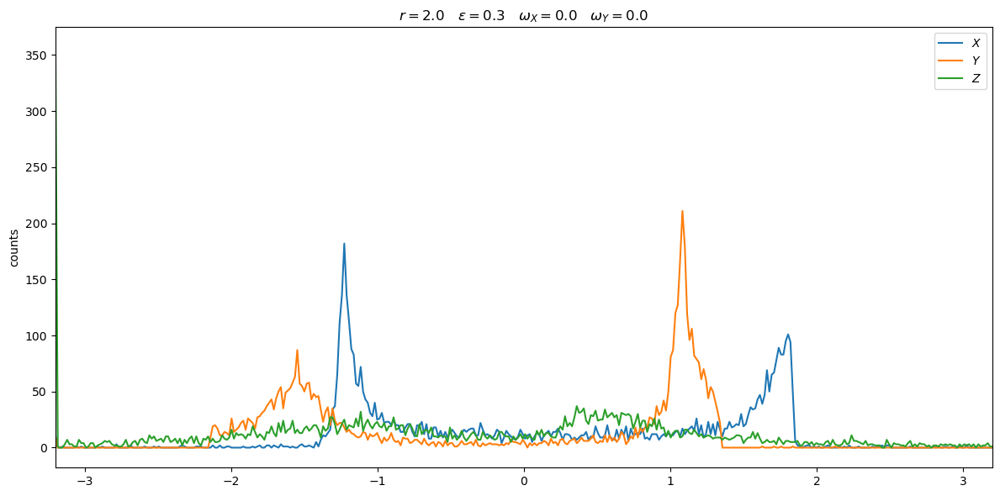

In [80]:
# set the value of the bifurcation parameter r = 2.0, and eps = 0.3
r = 2.0 ; eps=0.3 ; omega_x = 0. ; omega_y = 0.
# set the interval in which the initial values of the variables X, Y, Z 
# are sampled for starting the simulation
I_0 = [-1, 1]
# set the interval of the histogram
I_hist = [-3.2, 3.2]
# set the number of bins for the histogram, and the number of simulations
Nbins = 400
Nsim = 10000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

# run the simulations of the system
for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj(rng_0.uniform(low=I_0[0],high=I_0[1],size=3), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated steady state probability distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')
plt.title(fr'$r={r} \quad \epsilon={eps} \quad \omega_X={omega_x} \quad \omega_Y={omega_y}$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

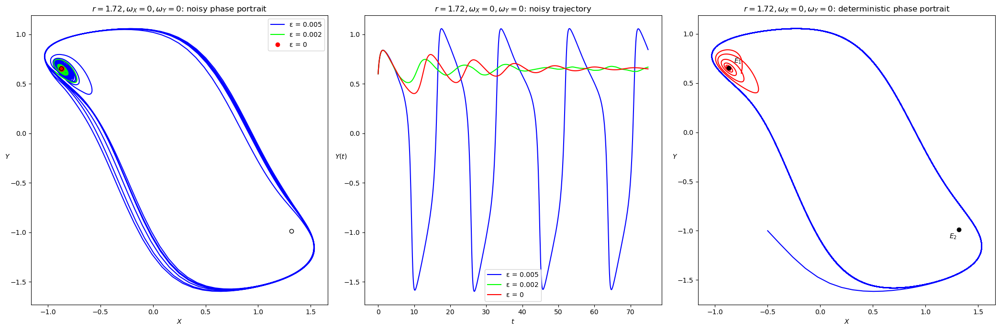

In [74]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 1.72

eps = 0.005; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
E1, E2 = system.deterministic_equilibria()
R, time = system.simulateTraj((-0.75, 0.6, 0.), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:750], R[1,:750], color='blue', label=f'ε = {eps}')

eps = 0.002; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((-0.75, 0.6, 0.), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:750], R[1,:750], color='lime', label=f'ε = {eps}')

eps = 0; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((-0.75, 0.6, 0.), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], 'o', color='red', label=f'ε = {eps}')
axs[1].plot(time[:750], R[1,:750], color='red', label=f'ε = {eps}')
axs[2].plot(R[0,:], R[1,:], color='red', label=f'ε = {eps}')

# refine the first two graphs
axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle='none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle='none')
axs[0].set_xlabel(r'$X$'); axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$'); axs[1].set_ylabel(r'$Y(t)$', rotation=0)

R2, time2 = system.simulateTraj((-0.5, -1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='blue', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].set_xlabel(r'$X$'); axs[2].set_ylabel(r'$Y$', rotation=0)

axs[0].legend()
axs[1].legend()
axs[0].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: noisy trajectory')
axs[2].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

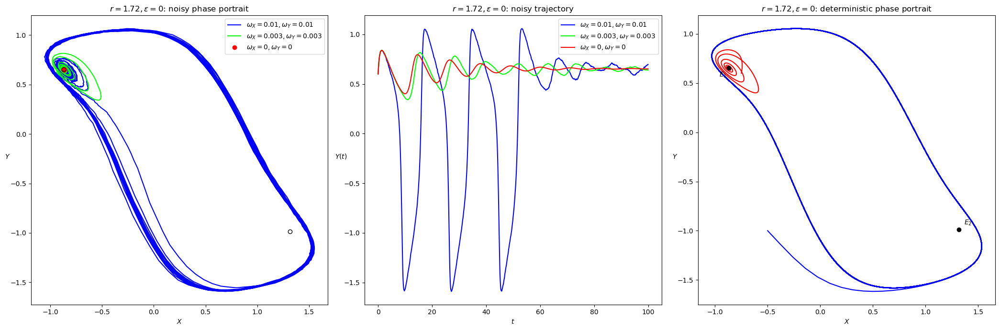

In [75]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 1.72

eps = 0; omega_x = 0.01 ; omega_y = 0.01
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
E1, E2 = system.deterministic_equilibria()
R, time = system.simulateTraj((-0.75, 0.6, 0.), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:1000], R[1,:1000], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

eps = 0; omega_x = 0.003 ; omega_y = 0.003
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((-0.75, 0.6, 0.), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:1000], R[1,:1000], color='lime', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

eps = 0; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((-0.75, 0.6, 0.), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], 'o', color='red', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:1000], R[1,:1000], color='red', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[2].plot(R[0,:], R[1,:], color='red', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

# refine the first two graphs
axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle='none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle='none')
axs[0].set_xlabel(r'$X$'); axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$'); axs[1].set_ylabel(r'$Y(t)$', rotation=0)

R2, time2 = system.simulateTraj((-0.5, -1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E1[0]-0.09, E1[1]-0.09, r'$E_1$')
axs[2].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')
axs[2].set_xlabel(r'$X$'); axs[2].set_ylabel(r'$Y$', rotation=0)

axs[0].legend()
axs[1].legend()
axs[0].set_title(fr'$r={r}, \epsilon={eps}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}, \epsilon={eps}$: noisy trajectory')
axs[2].set_title(fr'$r={r}, \epsilon={eps}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

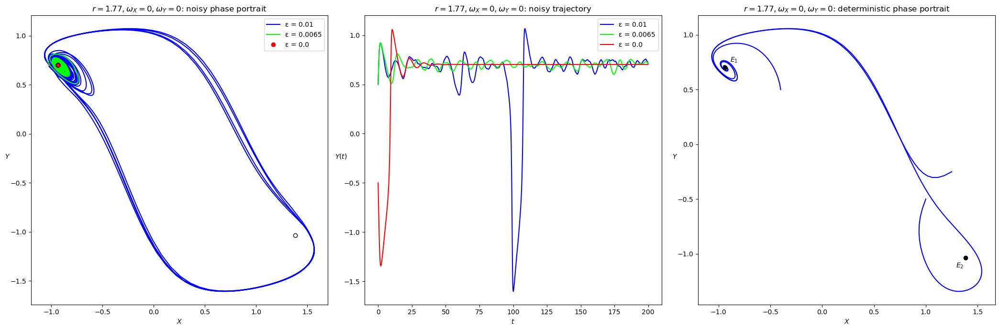

In [90]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 1.77

eps = 0.01 ; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
E1, E2 = system.deterministic_equilibria()
R, time = system.simulateTraj((-0.4, 0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=f'ε = {eps}')

eps = 0.0065 ; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((-0.4, 0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=f'ε = {eps}')

eps = 0. ; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], 'o', color='red', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=f'ε = {eps}')
axs[2].plot(R[0,:], R[1,:], color='blue', label=f'ε = {eps}')

# refine the first two graphs
axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle='none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle='none')
axs[0].set_xlabel(r'$X$'); axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$'); axs[1].set_ylabel(r'$Y(t)$', rotation=0)

# deterministc phase portrait
R2, time2 = system.simulateTraj((1.25, -0.25, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='blue', label=f'ε = {eps}')
R3, time3 = system.simulateTraj((-0.4, 0.5, 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[1,:], color='blue', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].set_xlabel(r'$X$'); axs[2].set_ylabel(r'$Y$', rotation=0)

axs[0].legend()
axs[1].legend()
axs[0].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: noisy trajectory')
axs[2].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

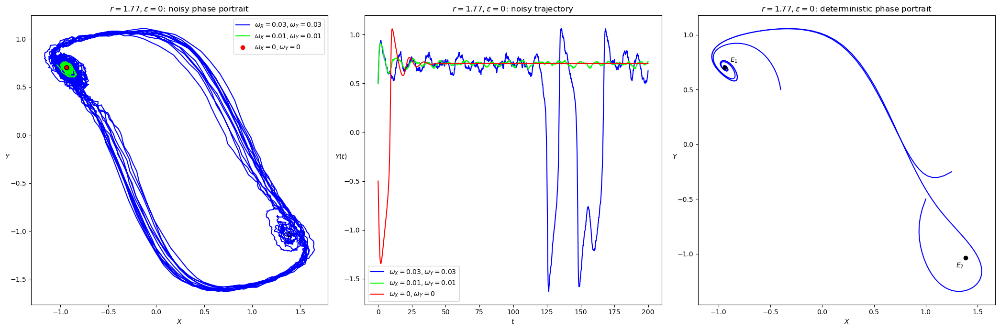

In [91]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 1.77

eps = 0 ; omega_x = 0.03 ; omega_y = 0.03
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
E1, E2 = system.deterministic_equilibria()
R, time = system.simulateTraj((-0.4, 0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

eps = 0 ; omega_x = 0.01 ; omega_y = 0.01
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((-0.4, 0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

eps = 0 ; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], 'o', color='red', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[2].plot(R[0,:], R[1,:], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

# refine the first two graphs
axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle='none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle='none')
axs[0].set_xlabel(r'$X$'); axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$'); axs[1].set_ylabel(r'$Y(t)$', rotation=0)

# deterministc phase portrait
R2, time2 = system.simulateTraj((1.25, -0.25, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
R3, time3 = system.simulateTraj((-0.4, 0.5, 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[1,:], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].set_xlabel(r'$X$'); axs[2].set_ylabel(r'$Y$', rotation=0)

axs[0].legend()
axs[1].legend()
axs[0].set_title(fr'$r={r}, \epsilon={eps}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}, \epsilon={eps}$: noisy trajectory')
axs[2].set_title(fr'$r={r}, \epsilon={eps}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

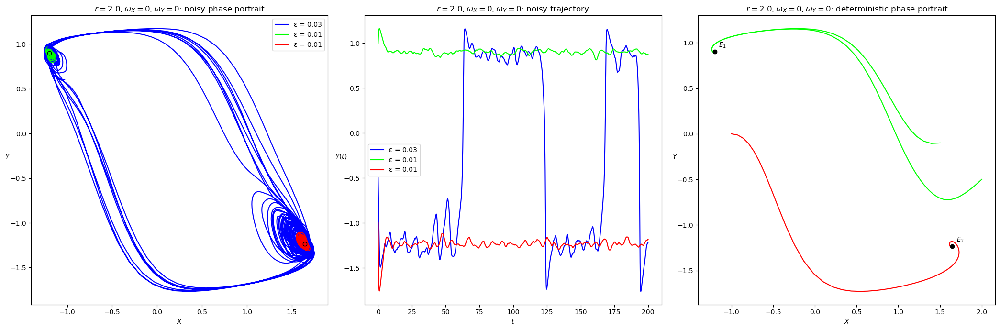

In [93]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 2.0

eps = 0.03; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
E1, E2 = system.deterministic_equilibria()
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=f'ε = {eps}')

eps = 0.01; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((1, 1, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=f'ε = {eps}')

eps = 0.01; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((-1, -1, 0.01), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], color='red', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=f'ε = {eps}')

axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle = 'none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle = 'none')

# deterministic phase portrait
eps = 0; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((2, -0.5, 0.01), 1000, 10000)
axs[2].plot(R[0,:], R[1,:], color='lime', label=f'ε = {eps}')
R2, time2 = system.simulateTraj((1.5, -0.1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='lime', label=f'ε = {eps}')
R3, time3 = system.simulateTraj((-1, -0., 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[1,:], color='red', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')

axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$')
axs[1].set_ylabel(r'$Y(t)$', rotation=0)
axs[2].set_xlabel(r'$X$')
axs[2].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()
axs[1].legend()

axs[0].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: noisy trajectory')
axs[2].set_title(fr'$r={r}, \omega_X={omega_x}, \omega_Y={omega_y}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

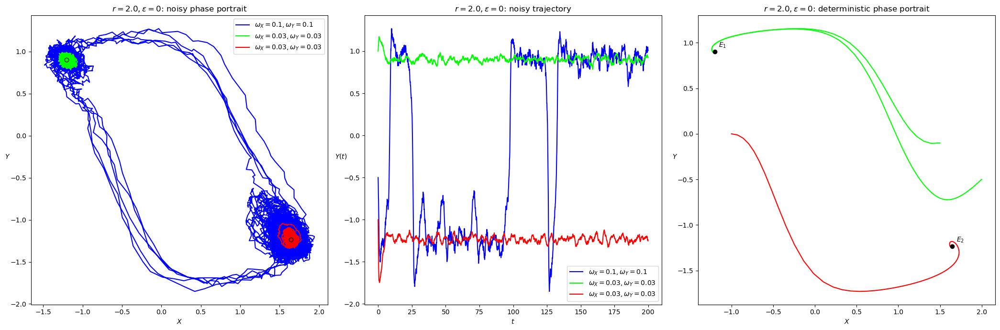

In [95]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 2.0

eps = 0; omega_x = 0.1 ; omega_y = 0.1
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
E1, E2 = system.deterministic_equilibria()
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

eps = 0; omega_x = 0.03 ; omega_y = 0.03
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((1, 1, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

eps = 0; omega_x = 0.03 ; omega_y = 0.03
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((-1, -1, 0.01), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], color='red', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')

axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle = 'none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle = 'none')

# deterministic phase portrait
eps = 0; omega_x = 0 ; omega_y = 0
system = Saltzmann_Maasch_advanced(r=r, a=0.8, b=0.3, c=0.3, d=0.2, eps=eps, omega_x=omega_x, omega_y=omega_y)
R, time = system.simulateTraj((2, -0.5, 0.01), 1000, 10000)
axs[2].plot(R[0,:], R[1,:], color='lime', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
R2, time2 = system.simulateTraj((1.5, -0.1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='lime', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
R3, time3 = system.simulateTraj((-1, -0., 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[1,:], color='red', label=fr'$\omega_X={omega_x}, \omega_Y={omega_y}$')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')

axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$')
axs[1].set_ylabel(r'$Y(t)$', rotation=0)
axs[2].set_xlabel(r'$X$')
axs[2].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()
axs[1].legend()

axs[0].set_title(fr'$r={r}, \epsilon={eps}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}, \epsilon={eps}$: noisy trajectory')
axs[2].set_title(fr'$r={r}, \epsilon={eps}$: deterministic phase portrait')
plt.tight_layout()
plt.show()

### And with Stratonovich ?

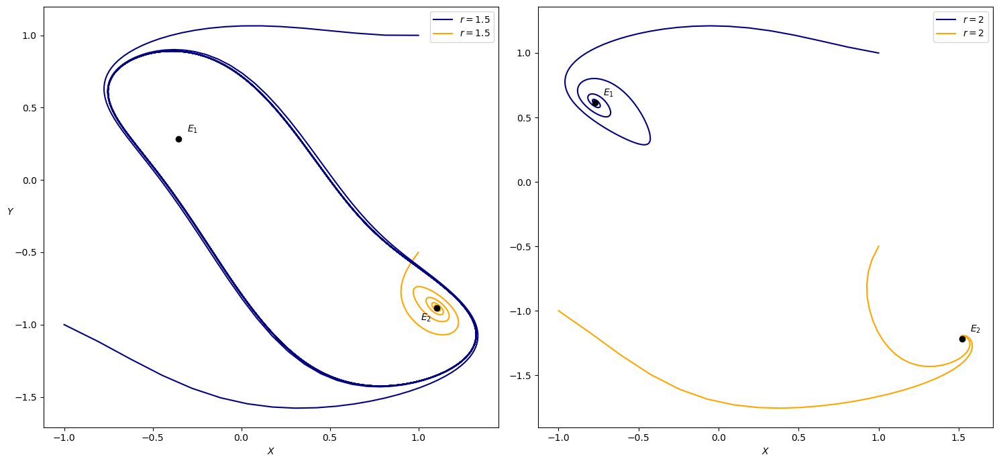

In [9]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r
r = 1.5
system = Saltzmann_Maasch(r=r, SDE_type='Stratonovich')
# simulate the system for the same value of r, three times
# for three different initial conditions
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0.01), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# plot the resulting trajectories, differentiating the color
# in function of the equilibrium convergence
axs[0].plot(R1[0], R1[1], color='navy'  , label = r'$r=1.5$')
axs[0].plot(R2[0], R2[1], color='orange', label = r'$r=1.5$')
axs[0].plot(R3[0], R3[1], color='navy')
# display the equilibrium points using the formula above
E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
axs[0].plot(E1[0], E1[1], 'o', color='black')
axs[0].plot(E2[0], E2[1], 'o', color='black')
axs[0].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[0].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of the parameter r
r = 2.
system = Saltzmann_Maasch(r=r, SDE_type='Stratonovich')
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# simulate the system three times again, using the same 
# initial points as in the case before
axs[1].plot(R1[0], R1[1], color='navy'  , label = r'$r=2$')
axs[1].plot(R2[0], R2[1], color='orange', label = r'$r=2$')
axs[1].plot(R3[0], R3[1], color='orange')
# display the equilibrium points
E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
axs[1].plot(E1[0], E1[1], 'o', color='black')
axs[1].plot(E2[0], E2[1], 'o', color='black')
axs[1].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[1].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

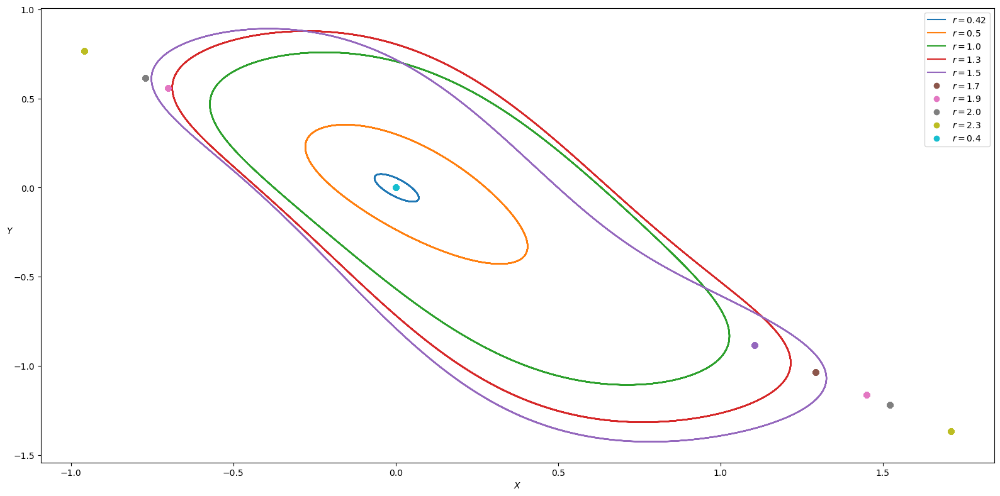

In [10]:
fig, ax = plt.subplots(figsize=(16,8))
color = iter(plt.cm.tab10(np.linspace(0, 1, 10)))

# define a set of values of the parameter r
for r in [0.42, 0.5, 1., 1.3, 1.5, 1.7, 1.9, 2., 2.3]:
    system = Saltzmann_Maasch(r=r, SDE_type='Stratonovich')
    c = next(color)
    # simulate the system for 3 different initial conditions, 
    # already examined before to characterize the basins of attraction
    R1, _ = system.simulateTraj((1,1,0.01), 1000, 10000)
    # if the system has reached a single attractive equilibrium point, 
    # display that point
    if (abs(R1[1,-1]-R1[1,-10])<1e-8):
        ax.plot(R1[0, 9500:], R1[1, 9500:],'o', color=c, label=fr'$r={r}$')
    # otherwise the system is following a certain closed trajectory, 
    # called 'attractor' trajectory, which is then displayed
    else:
        ax.plot(R1[0, 9500:], R1[1, 9500:], color=c, label=fr'$r={r}$')
    # simulate the system with a second initial point
    R2, _ = system.simulateTraj((1,-0.5,0.01), 1000, 10000)
    if (abs(R2[1,-1]-R2[1,-10])<1e-8):
        ax.plot(R2[0, 9500:], R2[1, 9500:],'o', color=c, label=fr'$r={r}$')
    else:
        ax.plot(R2[0, 9500:], R2[1, 9500:], color=c, label=fr'$r={r}$')
    # simulate the system with a third initial point
    R3, _ = system.simulateTraj((-0.5,0.5,1.), 1000, 10000)
    if (abs(R3[1,-1]-R3[1,-10])<1e-8):
        ax.plot(R3[0, 9500:], R3[1, 9500:],'o', color=c, label=fr'$r={r}$')
    else:
        ax.plot(R3[0, 9500:], R3[1, 9500:], color=c, label=fr'$r={r}$')

# simulate the system also for the value r=0.4, as done in the previous plots.
# In this case we know that the system has only the trivial equilibrium point E_0, 
# which is reached in a finite time by the system
for r in [0.4]:
    system = Saltzmann_Maasch(r=r, SDE_type='Stratonovich')
    R1, _ = system.simulateTraj((1, 1, 0), 1000, 10000)
    c = next(color)
    ax.plot(R1[0, 9500:], R1[1, 9500:], 'o', color=c, label=fr'$r={r}$')

# adjust the legend of labels
hand, labl = ax.get_legend_handles_labels()
handout=[]
lablout=[]
for h,l in zip(hand,labl):
   if l not in lablout:
        lablout.append(l)
        handout.append(h)
ax.legend(handout, lablout)

ax.set_xlabel(r'$X$')
ax.set_ylabel(r'$Y$', rotation=0)
plt.tight_layout()
plt.show()

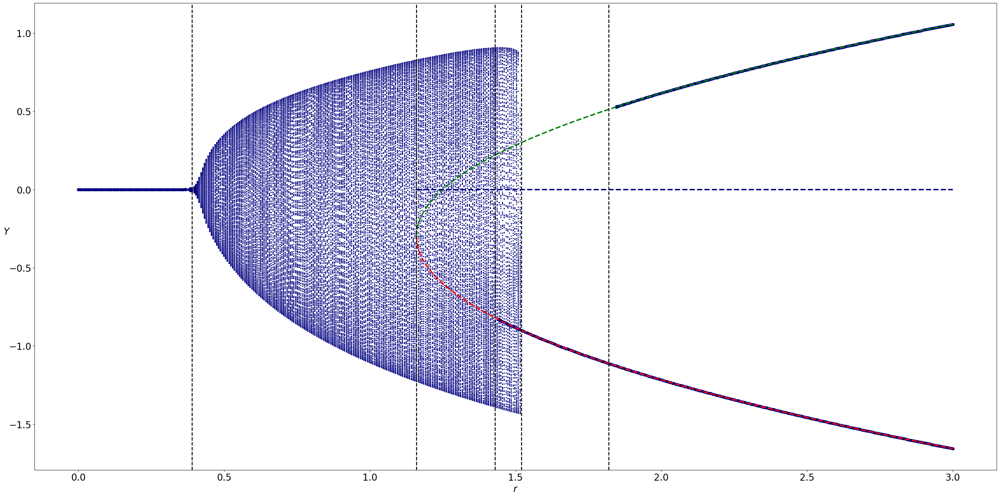

In [11]:
# create the bifurcation diagram
fig = plt.figure(figsize=(30,15))
r_vals = np.linspace(0., 3., 500)
for r in r_vals:
    system = Saltzmann_Maasch(r=r, SDE_type='Stratonovich')

    R0 = (1, 1, 0.01)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-3])<1e-5):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

    R0 = (1., -0.5, 0.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-4):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

    R0 = (-0.5, 0.5, 1.)
    R, time = system.simulateTraj(R0, 250, 2500)
    if (abs(R[1,-1]-R[1,-2])<1e-4):
        plt.plot(r, [R[1, 2400:]], ls='', ms=10, marker='.', color='navy')
    else:
        plt.plot(r, [R[1, 2400:]], ls='', ms=3, marker='.', color='navy')

x = np.linspace(1.16, 3, 1000)
plt.plot(x, -0.3-np.sqrt(x-1.16), ls='--', color='red',   lw=3)
plt.plot(x, -0.3+np.sqrt(x-1.16), ls='--', color='green', lw=3)
plt.plot(x, [0]*len(x),           ls='--', color='navy',  lw=3)

plt.axvline(x=0.39, ls='--', color='black', lw=2)
#plt.axvline(x=0.42, ls='--', color='black', lw=2)
plt.axvline(x=1.16, ls='--', color='black', lw=2)
plt.axvline(x=1.43, ls='--', color='black', lw=2)
plt.axvline(x=1.52, ls='--', color='black', lw=2)
plt.axvline(x=1.82, ls='--', color='black', lw=2)

#ax.fill_between(x, 0, 1, where=y < -theta, facecolor='red', alpha=0.5, transform=trans)

plt.xlabel(r'$r$', fontsize=20)
plt.ylabel(r'$Y$', fontsize=20, rotation=0)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()

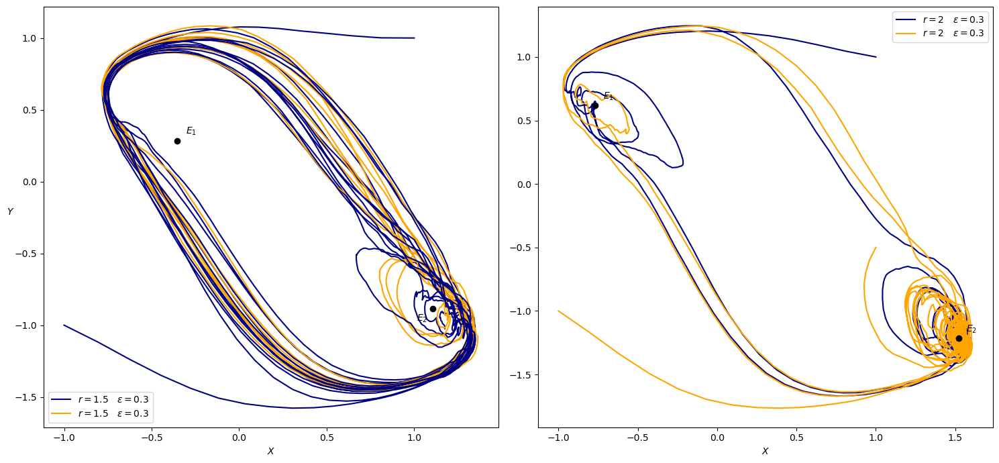

In [12]:
_, axs = plt.subplots(1,2, figsize=(15,7))

# set the value of the parameter r and the noise term eps
r = 1.5 ; eps=0.3
system = Saltzmann_Maasch(r=r, eps=eps, SDE_type='Stratonovich')
# simulate the system for the same value of r, three times
# for three different initial conditions
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0.01), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# plot the resulting trajectories, differentiating the color
# in function of the equilibrium convergence
axs[0].plot(R1[0], R1[1], color='navy'  , label = r'$r=1.5 \quad \epsilon=0.3$')
axs[0].plot(R2[0], R2[1], color='orange', label = r'$r=1.5 \quad \epsilon=0.3$')
axs[0].plot(R3[0], R3[1], color='navy')
# display the equilibrium points using the formula above
E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
axs[0].plot(E1[0], E1[1], 'o', color='black')
axs[0].plot(E2[0], E2[1], 'o', color='black')
axs[0].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[0].text(E2[0]-0.09, E2[1]-0.09, r'$E_2$')
axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()

# set another value of the parameter r
r = 2.
system = Saltzmann_Maasch(r=r, eps=eps, SDE_type='Stratonovich')
R1, time1 = system.simulateTraj((1, 1, 0), 100, 1000)
R2, time2 = system.simulateTraj((1, -0.5, 0), 100, 1000)
R3, time3 = system.simulateTraj((-1, -1, 0), 100, 1000)
# simulate the system three times again, using the same 
# initial points as in the case before
axs[1].plot(R1[0], R1[1], color='navy'  , label = r'$r=2 \quad \epsilon=0.3$')
axs[1].plot(R2[0], R2[1], color='orange', label = r'$r=2 \quad \epsilon=0.3$')
axs[1].plot(R3[0], R3[1], color='orange')
# display the equilibrium points
E1 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))
E2 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
axs[1].plot(E1[0], E1[1], 'o', color='black')
axs[1].plot(E2[0], E2[1], 'o', color='black')
axs[1].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[1].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')
axs[1].set_xlabel(r'$X$')
#axs[1].set_ylabel(r'$Y$')
axs[1].legend()

plt.tight_layout()
plt.show()

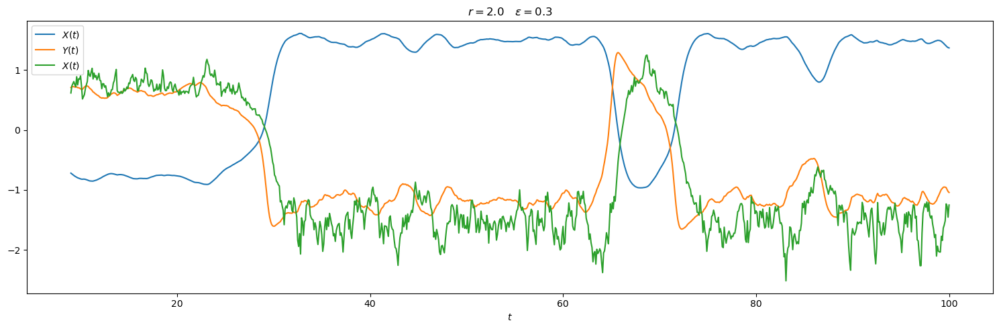

In [31]:
# instantiate the class for the system with a value r = 2.0, eps=0.3
system = Saltzmann_Maasch(r=2.0, eps=0.3, SDE_type='Stratonovich')
# simulate the trajectory for a certain initial point (1,1,1)
R, time = system.simulateTraj((1, 1, 1), 100, 1000)

plt.figure(figsize=(15, 5))
plt.xlabel(r'$t$')
plt.plot(time[90:], R[0,90:], label=r'$X(t)$')
plt.plot(time[90:], R[1,90:], label=r'$Y(t)$')
plt.plot(time[90:], R[2,90:], label=r'$X(t)$')
plt.title(r'$r=2.0 \quad \epsilon=0.3$')
plt.legend()
plt.tight_layout()
plt.show()

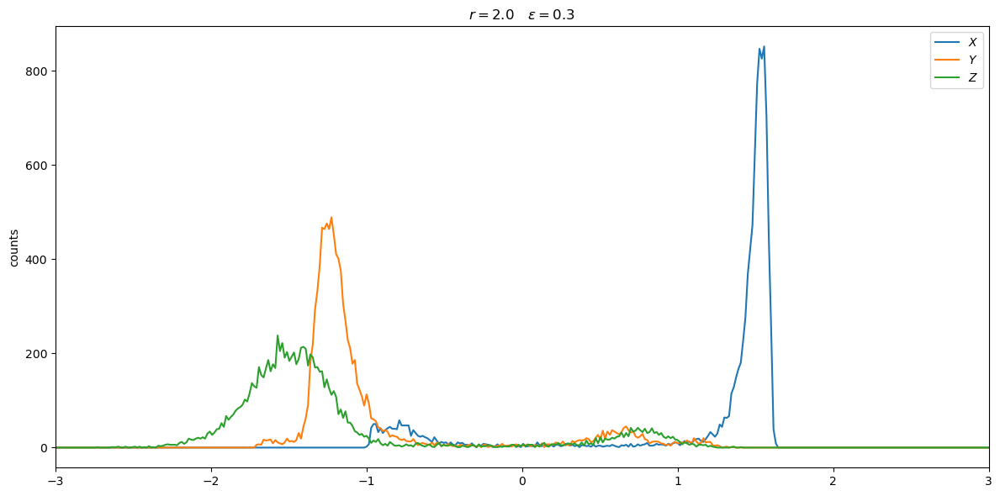

In [14]:
# set the value of the bifurcation parameter r = 2.0, and eps = 0.3
r = 2.0 ; eps = 0.3
# set the interval in which the initial values of the variables X, Y, Z 
# are sampled for starting the simulation
I_0 = [-1, 1]
# set the interval of the histogram
I_hist = [-3., 3.]
# set the number of bins for the histogram, and the number of simulations
Nbins = 400
Nsim = 10000
m = (I_hist[1]-I_hist[0])/Nbins

# instantiate the class object
system = Saltzmann_Maasch(r=r, eps=eps, SDE_type='Stratonovich')
X_bins = np.zeros(Nbins, dtype=float)
Y_bins = np.zeros(Nbins, dtype=float)
Z_bins = np.zeros(Nbins, dtype=float)

# run the simulations of the system
for _ in range(Nsim):
    # simulate a trajectory of the system for a sufficiently large time
    # i.e a sufficiently large number of steps
    R, time = system.simulateTraj(rng_0.uniform(low=I_0[0],high=I_0[1],size=3), 50, 500)
    # create the histogram which approximate the steady probability distribution
    # taking the last point in the trajectory after the time evolution
    for i in range(Nbins):
        if R[0,-1] < (m*(i+1)+I_hist[0]):
            X_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[1,-1] < (m*(i+1)+I_hist[0]):
            Y_bins[i] += 1.0
            break
    for i in range(Nbins):
        if R[2,-1] < (m*(i+1)+I_hist[0]):
            Z_bins[i] += 1.0
            break

# plot the simulated steady state probability distribution
plt.figure(figsize=(12, 6))
x = np.linspace(I_hist[0], I_hist[1], Nbins)
plt.xlim(I_hist[0], I_hist[1])
plt.plot(x, X_bins, label=r'$X$')
plt.plot(x, Y_bins, label=r'$Y$')
plt.plot(x, Z_bins, label=r'$Z$')
plt.title(r'$r=2.0 \quad \epsilon=0.3$')

plt.ylabel('counts')
plt.legend()
plt.tight_layout()
plt.show()

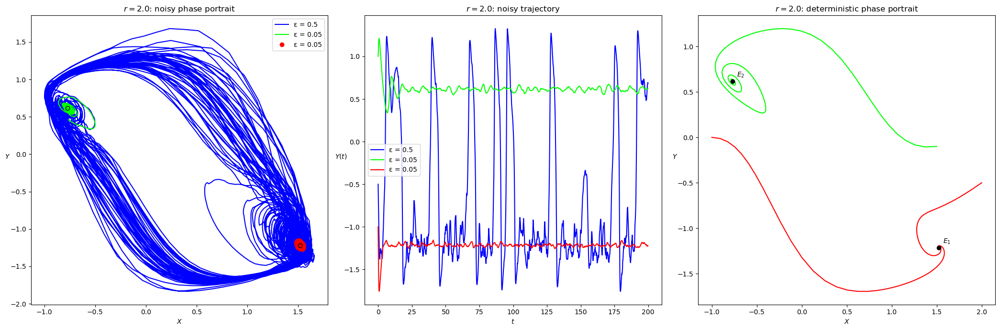

In [17]:
_, axs = plt.subplots(1,3, figsize=(21,7))

r = 2.
E1 = (-1.25*(-0.3-np.sqrt(r-1.16)), -0.3-np.sqrt(r-1.16))
E2 = (-1.25*(-0.3+np.sqrt(r-1.16)), -0.3+np.sqrt(r-1.16))

eps = 0.5
system = Saltzmann_Maasch(r=r, eps=eps, SDE_type='Stratonovich')
R, time = system.simulateTraj((1, -0.5, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='blue', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='blue', label=f'ε = {eps}')

eps = 0.05
system = Saltzmann_Maasch(r=r, eps=eps, SDE_type='Stratonovich')
R, time = system.simulateTraj((1, 1, 0.01), 1000, 10000)
axs[0].plot(R[0,50:], R[1,50:], color='lime', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='lime', label=f'ε = {eps}')

eps = 0.05
system = Saltzmann_Maasch(r=r, eps=eps, SDE_type='Stratonovich')
R, time = system.simulateTraj((-1, -1, 0.01), 1000, 10000)
axs[0].plot(R[0,990:], R[1,990:], 'o', color='red', label=f'ε = {eps}')
axs[1].plot(time[:2000], R[1,:2000], color='red', label=f'ε = {eps}')

axs[0].plot(E1[0], E1[1], 'o', color='black', fillstyle = 'none')
axs[0].plot(E2[0], E2[1], 'o', color='black', fillstyle = 'none')

# deterministic phase portrait
eps = 0
system = Saltzmann_Maasch(r=r, eps=eps, SDE_type='Stratonovich')
R, time = system.simulateTraj((2, -0.5, 0.01), 1000, 10000)
axs[2].plot(R[0,:], R[1,:], color='red', label=f'ε = {eps}')
R2, time2 = system.simulateTraj((1.5, -0.1, 0.01), 1000, 10000)
axs[2].plot(R2[0,:], R2[1,:], color='lime', label=f'ε = {eps}')
R3, time3 = system.simulateTraj((-1, -0., 0.01), 1000, 10000)
axs[2].plot(R3[0,:], R3[1,:], color='red', label=f'ε = {eps}')
axs[2].plot(E1[0], E1[1], 'o', color='black')
axs[2].plot(E2[0], E2[1], 'o', color='black')
axs[2].text(E1[0]+0.05, E1[1]+0.05, r'$E_1$')
axs[2].text(E2[0]+0.05, E2[1]+0.05, r'$E_2$')

axs[0].set_xlabel(r'$X$')
axs[0].set_ylabel(r'$Y$', rotation=0)
axs[1].set_xlabel(r'$t$')
axs[1].set_ylabel(r'$Y(t)$', rotation=0)
axs[2].set_xlabel(r'$X$')
axs[2].set_ylabel(r'$Y$', rotation=0)
axs[0].legend()
axs[1].legend()

axs[0].set_title(fr'$r={r}$: noisy phase portrait')
axs[1].set_title(fr'$r={r}$: noisy trajectory')
axs[2].set_title(fr'$r={r}$: deterministic phase portrait')
plt.tight_layout()
plt.show()